# Setup

## Install

In [ ]:
!pip install progressbar2

In [ ]:
!pip install tensorboardX

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 1.9 MB/s eta 0:00:00


In [ ]:
!pip install trimesh

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 688.9/688.9 kB 8.3 MB/s eta 0:00:00


In [ ]:
!pip install ninja

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 5.1 MB/s eta 0:00:00


In [ ]:
import torch

!pip uninstall torch-scatter torch-sparse torch-geometric torch-cluster  --y
!pip install torch-scatter -f https://data.pyg.org/whl/torch-{torch.__version__}.html
!pip install torch-sparse -f https://data.pyg.org/whl/torch-{torch.__version__}.html
!pip install torch-cluster -f https://data.pyg.org/whl/torch-{torch.__version__}.html
!pip install git+https://github.com/pyg-team/pytorch_geometric.git

Looking in links: https://data.pyg.org/whl/torch-2.1.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 54.4 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.1.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 71.4 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.1.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 65.4 MB/s eta 0:00:00
  Cloning https://github.com/pyg-team/pytorch_geometric.git to /tmp/pip-req-build-bfe5t1it
  Running command git clone --filter=blob:none --quiet https://github.com/pyg-team/pytorch_geometric.git /tmp/pip-req-build-bfe5t1it
  Resolved https://github.com/pyg-team/pytorch_geometric.git to commit 0e526ab546b135dd8d5fbd55174d74da1e4028be
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.4.0-py3-none-any.whl size=10

In [ ]:
!apt-get install -y git

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git is already the newest version (1:2.34.1-1ubuntu1.10).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
!pip install --upgrade --no-cache-dir gdown >/dev/null

In [ ]:
!pip install pyquaternion

In [ ]:
!pip install pymesh

  Preparing metadata (setup.py) ... done
  Created wheel for pymesh: filename=pymesh-1.0.2-py3-none-any.whl size=6901 sha256=f81c6c8e4d9c3d80777511a443387b714cc0190c7cfb0947770d901c4d0770e5
  Stored in directory: /root/.cache/pip/wheels/3d/aa/05/b758da80b5028b4bbf0d0ed86ec9099ca40e195563fd32b7b8
Successfully built pymesh


In [ ]:
!pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 20.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


## Import

In [ ]:
import numpy
import scipy
import sklearn
import matplotlib
import progressbar
import tensorboardX
import trimesh
import torch
import torchvision
import ninja
import shapely
import jupyter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Set root directory
root_dir = '/content/drive/MyDrive/MIT Creative Machine Learning/Final Project/structurenet0503'

# Change working directory to root directory
os.chdir(root_dir)

# Confirm current working directory
print("Current working directory is:", os.getcwd())

Current working directory is: /content/drive/MyDrive/MIT Creative Machine Learning/Final Project/structurenet0503


## Clone Model

In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/MIT Creative Machine Learning/Final Project/structurenet0503/code')

#Helper functions

In [ ]:
sys.path.append('./code/cube.pts')
sys.path.append('./code/chamfer_distance')

In [ ]:
from chamfer_distance import ChamferDistance

## Tree class

In [ ]:
import sys
import os
import json
import torch
import numpy as np
from torch.utils import data
from pyquaternion import Quaternion
from sklearn.decomposition import PCA
from collections import namedtuple
from utils import one_hot
import trimesh

In [ ]:

# def quaternion_from_matrix(matrix, rtol=1e-5, atol=1e-8):
#     def custom_from_matrix(cls, matrix, **kwargs):
#         return Quaternion._from_matrix(cls, matrix, rtol=rtol, atol=atol)

#     original_from_matrix = Quaternion._from_matrix
#     Quaternion._from_matrix = custom_from_matrix

#     q = Quaternion(matrix=matrix)

#     # Restore the original method after creating the quaternion
#     Quaternion._from_matrix = original_from_matrix

#     return q

In [ ]:

def rotmat_to_quaternion(rotmat, rtol=1e-5, atol=1e-8):
    q = np.empty(4)
    t = np.trace(rotmat)
    if t > 0.0:
        r = np.sqrt(1.0 + t)
        s = 0.5 / r
        q[0] = 0.5 * r
        q[1] = (rotmat[2, 1] - rotmat[1, 2]) * s
        q[2] = (rotmat[0, 2] - rotmat[2, 0]) * s
        q[3] = (rotmat[1, 0] - rotmat[0, 1]) * s
    else:
        i = np.argmax(np.diagonal(rotmat))
        j = (i + 1) % 3
        k = (j + 1) % 3
        r = np.sqrt(1.0 + rotmat[i, i] - rotmat[j, j] - rotmat[k, k])
        s = 0.5 / r
        q[i + 1] = 0.5 * r
        q[j + 1] = (rotmat[i, j] + rotmat[j, i]) * s
        q[k + 1] = (rotmat[i, k] + rotmat[k, i]) * s
        q[0] = (rotmat[k, j] - rotmat[j, k]) * s
    return q

In [ ]:
class Tree(object):

    # global object category information
    part_name2id = dict()
    part_id2name = dict()
    part_name2cids = dict()
    part_non_leaf_sem_names = []
    num_sem = None
    root_sem = None

    @ staticmethod
    def load_category_info(cat):
        path = os.path.join('./stats/part_semantics/', cat+'.txt')
        with open(path, 'r') as fin:

            for l in fin.readlines():
                x, y, _ = l.rstrip().split()
                x = int(x)
                Tree.part_name2id[y] = x
                Tree.part_id2name[x] = y
                Tree.part_name2cids[y] = []
                if '/' in y:
                    Tree.part_name2cids['/'.join(y.split('/')[:-1])].append(x)
        Tree.num_sem = len(Tree.part_name2id) + 1
        for k in Tree.part_name2cids:
            Tree.part_name2cids[k] = np.array(Tree.part_name2cids[k], dtype=np.int32)
            if len(Tree.part_name2cids[k]) > 0:
                Tree.part_non_leaf_sem_names.append(k)
        Tree.root_sem = Tree.part_id2name[1]
        # print("Tree.num_sem:", Tree.num_sem)
        # print("Tree.part_name2id:", Tree.part_name2id)
        # print("Tree.part_id2name:", Tree.part_id2name)


    # store a part node in the tree
    class Node(object):

        def __init__(self, part_id=0, is_leaf=False, box=None, label=None, children=None, edges=None, full_label=None, geo=None, geo_feat=None):
            self.is_leaf = is_leaf          # store True if the part is a leaf node
            self.part_id = part_id          # part_id in result_after_merging.json of PartNet
            self.box = box                  # box parameter for all nodes
            self.geo = geo                  # 1 x 1000 x 3 point cloud
            self.geo_feat = geo_feat        # 1 x 100 geometry feature
            self.label = label              # node semantic label at the current level
            self.full_label = full_label    # node semantic label from root (separated by slash)
            self.children = [] if children is None else children
                                            # all of its children nodes; each entry is a Node instance
            self.edges = [] if edges is None else edges
                                            # all of its children relationships;
                                            # each entry is a tuple <part_a, part_b, type, params, dist>
            """
                Here defines the edges format:
                    part_a, part_b:
                        Values are the order in self.children (e.g. 0, 1, 2, 3, ...).
                        This is an directional edge for A->B.
                        If an edge is commutative, you may need to manually specify a B->A edge.
                        For example, an ADJ edge is only shown A->B,
                        there is no edge B->A in the json file.
                    type:
                        Four types considered in StructureNet: ADJ, ROT_SYM, TRANS_SYM, REF_SYM.
                    params:
                        There is no params field for ADJ edge;
                        For ROT_SYM edge, 0-2 pivot point, 3-5 axis unit direction, 6 radian rotation angle;
                        For TRANS_SYM edge, 0-2 translation vector;
                        For REF_SYM edge, 0-2 the middle point of the segment that connects the two box centers,
                            3-5 unit normal direction of the reflection plane.
                    dist:
                        For ADJ edge, it's the closest distance between two parts;
                        For SYM edge, it's the chamfer distance after matching part B to part A.
            """

        def get_semantic_id(self):
            return Tree.part_name2id[self.full_label]

        def get_semantic_one_hot(self):
            out = np.zeros((1, Tree.num_sem), dtype=np.float32)
            out[0, Tree.part_name2id[self.full_label]] = 1
            return torch.tensor(out, dtype=torch.float32).to(device=self.box.device)



        def get_box_quat(self):
            box = self.box.cpu().numpy().squeeze()
            center = box[:3]
            size = box[3:6]
            xdir = box[6:9]
            xdir /= np.linalg.norm(xdir)
            ydir = box[9:]
            ydir /= np.linalg.norm(ydir)
            zdir = np.cross(xdir, ydir)
            zdir /= np.linalg.norm(zdir)
            rotmat = np.vstack([xdir, ydir, zdir]).T
            # def gram_schmidt(mat):
            #   result = np.zeros_like(mat)
            #   for i in range(mat.shape[1]):
            #       v = mat[:, i]
            #       for j in range(i):
            #           v -= np.dot(mat[:, i], result[:, j]) * result[:, j]
            #       v /= np.linalg.norm(v)
            #       result[:, i] = v
            #   return result
            # print("Before orthogonalization:")
            # print("Rotmat:", rotmat)
            # print("Rotmat * Rotmat.T:", np.dot(rotmat, rotmat.T))
            # print("Det(Rotmat):", np.linalg.det(rotmat))

            # rotmat = gram_schmidt(rotmat)

            # print("\nAfter orthogonalization:")
            # print("Rotmat:", rotmat)
            # print("Rotmat * Rotmat.T:", np.dot(rotmat, rotmat.T))
            # print("Det(Rotmat):", np.linalg.det(rotmat))
            rounded_rotmat = np.round(rotmat, decimals=8)
            quat = rotmat_to_quaternion(rounded_rotmat)
            box_quat = np.hstack([center, size, quat]).astype(np.float32)
            return torch.from_numpy(box_quat).view(1, -1).to(device=self.box.device)

        def set_from_box_quat(self, box_quat):
            box_quat = box_quat.cpu().numpy().squeeze()
            center = box_quat[:3]
            size = box_quat[3:6]
            q = Quaternion(box_quat[6], box_quat[7], box_quat[8], box_quat[9])
            rotmat = q.rotation_matrix
            box = np.hstack([center, size, rotmat[:, 0].flatten(), rotmat[:, 1].flatten()]).astype(np.float32)
            self.box = torch.from_numpy(box).view(1, -1)

        def to(self, device):
            if self.box is not None:
                self.box = self.box.to(device)
            for edge in self.edges:
                if 'params' in edge:
                    edge['params'].to(device)
            if self.geo is not None:
                self.geo = self.geo.to(device)

            for child_node in self.children:
                child_node.to(device)

            return self

        def _to_str(self, level, pid, detailed=False):
            out_str = '  |'*(level-1) + '  ├'*(level > 0) + str(pid) + ' ' + self.label + (' [LEAF] ' if self.is_leaf else '    ') + '{' + str(self.part_id) + '}'
            if detailed:
                out_str += 'Box('+';'.join([str(item) for item in self.box.numpy()])+')\n'
            else:
                out_str += '\n'

            if len(self.children) > 0:
                for idx, child in enumerate(self.children):
                    out_str += child._to_str(level+1, idx)

            if detailed and len(self.edges) > 0:
                for edge in self.edges:
                    if 'params' in edge:
                        edge = edge.copy() # so the original parameters don't get changed
                        edge['params'] = edge['params'].cpu().numpy()
                    out_str += '  |'*(level) + '  ├' + 'Edge(' + str(edge) + ')\n'

            return out_str

        def __str__(self):
            return self._to_str(0, 0)

        def depth_first_traversal(self):
            nodes = []

            stack = [self]
            while len(stack) > 0:
                node = stack.pop()
                nodes.append(node)

                stack.extend(reversed(node.children))

            return nodes

        def child_adjacency(self, typed=False, max_children=None):
            if max_children is None:
                adj = torch.zeros(len(self.children), len(self.children))
            else:
                adj = torch.zeros(max_children, max_children)

            if typed:
                edge_types = ['ADJ', 'ROT_SYM', 'TRANS_SYM', 'REF_SYM']

            for edge in self.edges:
                if typed:
                    edge_type_index = edge_types.index(edge['type'])
                    adj[edge['part_a'], edge['part_b']] = edge_type_index
                    adj[edge['part_b'], edge['part_a']] = edge_type_index
                else:
                    adj[edge['part_a'], edge['part_b']] = 1
                    adj[edge['part_b'], edge['part_a']] = 1

            return adj

        def geos(self, leafs_only=True):
            nodes = list(self.depth_first_traversal())
            out_geos = []; out_nodes = [];
            for node in nodes:
                if not leafs_only or node.is_leaf:
                    out_geos.append(node.geo)
                    out_nodes.append(node)
            return out_geos, out_nodes

        def boxes(self, per_node=False, leafs_only=False):
            nodes = list(reversed(self.depth_first_traversal()))
            node_boxesets = []
            boxes_stack = []
            for node in nodes:
                node_boxes = []
                for i in range(len(node.children)):
                    node_boxes = boxes_stack.pop() + node_boxes

                if node.box is not None and (not leafs_only or node.is_leaf):
                    node_boxes.append(node.box)

                if per_node:
                    node_boxesets.append(node_boxes)

                boxes_stack.append(node_boxes)

            assert len(boxes_stack) == 1

            if per_node:
                return node_boxesets, list(nodes)
            else:
                boxes = boxes_stack[0]
                return boxes

        def graph(self, leafs_only=False):
            part_boxes = []
            part_geos = []
            edges = []
            part_ids = []
            part_sems = []

            nodes = list(reversed(self.depth_first_traversal()))

            box_index_offset = 0
            for node in nodes:
                child_count = 0
                box_idx = {}
                for i, child in enumerate(node.children):
                    if leafs_only and not child.is_leaf:
                        continue

                    part_boxes.append(child.box)
                    part_geos.append(child.geo)
                    part_ids.append(child.part_id)
                    part_sems.append(child.full_label)

                    box_idx[i] = child_count+box_index_offset
                    child_count += 1

                for edge in node.edges:
                    if leafs_only and not (
                            node.children[edge['part_a']].is_leaf and
                            node.children[edge['part_b']].is_leaf):
                        continue
                    edges.append(edge.copy())
                    edges[-1]['part_a'] = box_idx[edges[-1]['part_a']]
                    edges[-1]['part_b'] = box_idx[edges[-1]['part_b']]

                box_index_offset += child_count

            return part_boxes, part_geos, edges, part_ids, part_sems

        def edge_tensors(self, edge_types, device, type_onehot=True):
            num_edges = len(self.edges)

            # get directed edge indices in both directions as tensor
            edge_indices = torch.tensor(
                [[e['part_a'], e['part_b']] for e in self.edges] + [[e['part_b'], e['part_a']] for e in self.edges],
                device=device, dtype=torch.long).view(1, num_edges*2, 2)

            # get edge type as tensor
            edge_type = torch.tensor([edge_types.index(edge['type']) for edge in self.edges], device=device, dtype=torch.long)
            if type_onehot:
                edge_type = one_hot(inp=edge_type, label_count=len(edge_types)).transpose(0, 1).view(1, num_edges, len(edge_types)).to(dtype=torch.float32)
            else:
                edge_type = edge_type.view(1, num_edges)
            edge_type = torch.cat([edge_type, edge_type], dim=1) # add edges in other direction (symmetric adjacency)

            return edge_type, edge_indices

        def get_subtree_edge_count(self):
            cnt = 0
            if self.children is not None:
                for cnode in self.children:
                    cnt += cnode.get_subtree_edge_count()
            if self.edges is not None:
                cnt += len(self.edges)
            return cnt


    # functions for class Tree
    def __init__(self, root):
        self.root = root

    def to(self, device):
        self.root = self.root.to(device)
        return self

    def __str__(self):
        return str(self.root)

    def depth_first_traversal(self):
        return self.root.depth_first_traversal()

    def boxes(self, per_node=False, leafs_only=False):
        return self.root.boxes(per_node=per_node, leafs_only=leafs_only)

    def graph(self, leafs_only=False):
        return self.root.graph(leafs_only=leafs_only)

    def free(self):
        for node in self.depth_first_traversal():
            del node.geo
            del node.geo_feat
            del node.box
            del node


## PartNet class


In [ ]:
class PartNetDataset(data.Dataset):

    def __init__(self, root, object_list, data_features, load_geo=False):
        self.root = root
        self.data_features = data_features
        self.load_geo = load_geo

        if isinstance(object_list, str):
            with open(os.path.join(self.root, object_list), 'r') as f:
                self.object_names = [item.rstrip() for item in f.readlines()]
        else:
            self.object_names = object_list

    def __getitem__(self, index):
        if 'object' in self.data_features:
            obj = self.load_object(os.path.join(self.root, self.object_names[index]+'.json'), \
                    load_geo=self.load_geo)

        data_feats = ()
        for feat in self.data_features:
            if feat == 'object':
                data_feats = data_feats + (obj,)
            elif feat == 'name':
                data_feats = data_feats + (self.object_names[index],)
            else:
                assert False, 'ERROR: unknow feat type %s!' % feat

        return data_feats

    def __len__(self):
        return len(self.object_names)

    def get_anno_id(self, anno_id):
        obj = self.load_object(os.path.join(self.root, anno_id+'.json'), \
                load_geo=self.load_geo)
        return obj

    @staticmethod
    def load_object(fn, load_geo=False):
        if load_geo:
            geo_fn = fn.replace('_hier', '_geo').replace('json', 'npz')
            geo_data = np.load(geo_fn)

        with open(fn, 'r') as f:
            root_json = json.load(f)

        # create a virtual parent node of the root node and add it to the stack
        StackElement = namedtuple('StackElement', ['node_json', 'parent', 'parent_child_idx'])
        stack = [StackElement(node_json=root_json, parent=None, parent_child_idx=None)]

        root = None
        # traverse the tree, converting each node json to a Node instance
        while len(stack) > 0:
            stack_elm = stack.pop()

            parent = stack_elm.parent
            parent_child_idx = stack_elm.parent_child_idx
            node_json = stack_elm.node_json

            node = Tree.Node(
                part_id=node_json['id'],
                is_leaf=('children' not in node_json),
                label=node_json['label'])

            if 'geo' in node_json.keys():
                node.geo = torch.tensor(np.array(node_json['geo']), dtype=torch.float32).view(1, -1, 3)

            if load_geo:
                node.geo = torch.tensor(geo_data['parts'][node_json['id']], dtype=torch.float32).view(1, -1, 3)

            if 'box' in node_json:
                node.box = torch.from_numpy(np.array(node_json['box'])).to(dtype=torch.float32)

            if 'children' in node_json:
                for ci, child in enumerate(node_json['children']):
                    stack.append(StackElement(node_json=node_json['children'][ci], parent=node, parent_child_idx=ci))

            if 'edges' in node_json:
                for edge in node_json['edges']:
                    if 'params' in edge:
                        edge['params'] = torch.from_numpy(np.array(edge['params'])).to(dtype=torch.float32)
                    node.edges.append(edge)

            if parent is None:
                root = node
                root.full_label = root.label
            else:
                if len(parent.children) <= parent_child_idx:
                    parent.children.extend([None] * (parent_child_idx+1-len(parent.children)))
                parent.children[parent_child_idx] = node
                node.full_label = parent.full_label + '/' + node.label

        obj = Tree(root=root)

        return obj

    @staticmethod
    def save_object(obj, fn):

        # create a virtual parent node of the root node and add it to the stack
        StackElement = namedtuple('StackElement', ['node', 'parent_json', 'parent_child_idx'])
        stack = [StackElement(node=obj.root, parent_json=None, parent_child_idx=None)]

        obj_json = None

        # traverse the tree, converting child nodes of each node to json
        while len(stack) > 0:
            stack_elm = stack.pop()

            parent_json = stack_elm.parent_json
            parent_child_idx = stack_elm.parent_child_idx
            node = stack_elm.node

            node_json = {
                'id': node.part_id,
                'label': f'{node.label if node.label is not None else ""}'}

            if node.geo is not None:
                node_json['geo'] = node.geo.cpu().numpy().reshape(-1).tolist()

            if node.box is not None:
                node_json['box'] = node.box.cpu().numpy().reshape(-1).tolist()

            if len(node.children) > 0:
                node_json['children'] = []
            for child in node.children:
                node_json['children'].append(None)
                stack.append(StackElement(node=child, parent_json=node_json, parent_child_idx=len(node_json['children'])-1))

            if len(node.edges) > 0:
                node_json['edges'] = []
            for edge in node.edges:
                node_json['edges'].append(edge)
                if 'params' in edge:
                    node_json['edges'][-1]['params'] = node_json['edges'][-1]['params'].cpu().numpy().reshape(-1).tolist()

            if parent_json is None:
                obj_json = node_json
            else:
                parent_json['children'][parent_child_idx] = node_json

        with open(fn, 'w') as f:
            json.dump(obj_json, f)


## utils


In [ ]:
def load_obj(fn):
    # print(os.getcwd())
    # print(fn)
    fin = open(fn, 'r')
    lines = [line.rstrip() for line in fin]
    fin.close()

    vertices = []; faces = [];
    for line in lines:
        if line.startswith('v '):
            vertices.append(np.float32(line.split()[1:4]))
        elif line.startswith('f '):
            faces.append(np.int32([item.split('/')[0] for item in line.split()[1:4]]))

    f = np.vstack(faces)
    v = np.vstack(vertices)
    return v, f

In [ ]:
def gen_obb_mesh(obbs):
    # load cube
    cube_v, cube_f = load_obj('./code/cube.obj')

    all_v = []; all_f = []; vid = 0;
    for pid in range(obbs.shape[0]):
        p = obbs[pid, :]
        center = p[0: 3]
        lengths = p[3: 6]
        dir_1 = p[6: 9]
        dir_2 = p[9: ]

        dir_1 = dir_1/np.linalg.norm(dir_1)
        dir_2 = dir_2/np.linalg.norm(dir_2)
        dir_3 = np.cross(dir_1, dir_2)
        dir_3 = dir_3/np.linalg.norm(dir_3)

        v = np.array(cube_v, dtype=np.float32)
        f = np.array(cube_f, dtype=np.int32)
        rot = np.vstack([dir_1, dir_2, dir_3])
        v *= lengths
        v = np.matmul(v, rot)
        v += center

        all_v.append(v)
        all_f.append(f+vid)
        vid += v.shape[0]

    all_v = np.vstack(all_v)
    all_f = np.vstack(all_f)
    return all_v, all_f

In [ ]:
def load_checkpoint(models, model_names, dirname, epoch=None, optimizers=None, optimizer_names=None, strict=True):
    print(dirname)
    if len(models) != len(model_names) or (optimizers is not None and len(optimizers) != len(optimizer_names)):
        raise ValueError('Number of models, model names, or optimizers does not match.')

    for model, model_name in zip(models, model_names):
        print(model_name)
        filename = f'net_{model_name}.pth'
        if epoch is not None:
            filename = f'{epoch}_' + filename
        print(filename)
        model.load_state_dict(torch.load(os.path.join(dirname, filename)), strict=strict)

    start_epoch = 0
    if optimizers is not None:
        filename = os.path.join(dirname, 'checkpt.pth')
        if epoch is not None:
            filename = f'{epoch}_' + filename
        if os.path.exists(filename):
            checkpt = torch.load(filename)
            start_epoch = checkpt['epoch']
            for opt, optimizer_name in zip(optimizers, optimizer_names):
                opt.load_state_dict(checkpt[f'opt_{optimizer_name}'])
            print(f'resuming from checkpoint {filename}')
        else:
            response = input(f'Checkpoint {filename} not found for resuming, refine saved models instead? (y/n) ')
            if response != 'y':
                sys.exit()

    return start_epoch


##Pasrse Function

In [ ]:
def add_base_args(parser):
    parser.add_argument('--exp_name', type=str, default='no_name', help='name of the training run')
    parser.add_argument('--category', type=str, default='Chair', help='object category')
    parser.add_argument('--device', type=str, default='cuda:0', help='cpu or cuda:x for using cuda on GPU number x')
    parser.add_argument('--seed', type=int, default=3124256514, help='random seed (for reproducibility)')

    return parser

def add_model_args(parser):
    parser.add_argument('--model_path', type=str, default='./data/models')

    return parser

def add_data_args(parser):
    parser.add_argument('--data_path', type=str, default='')
    parser.add_argument('--train_dataset', type=str, default='train.txt', help='file name for the list of object names for training')
    parser.add_argument('--edge_types', type=str, nargs='*', default=['ADJ', 'ROT_SYM', 'TRANS_SYM', 'REF_SYM'], help='list of possible edge types')

    return parser

In [ ]:
def add_result_args(parser):
    parser = add_base_args(parser)
    parser = add_model_args(parser)

    parser.add_argument('--result_path', type=str, default='./data/results')
    parser.add_argument('--model_epoch', type=int, default=-1, help='model at what epoch to use (set to < 0 for the final/most recent model)')

    return parser

In [ ]:
def add_eval_args(parser):
    parser = add_result_args(parser)
    parser = add_data_args(parser)

    parser.add_argument('--test_dataset', type=str, default='test.txt', help='file name for the list of object names for testing')

    return  parser

# Model

## Model Structure


In [ ]:
import os
import sys
import numpy as np
import torch
import torch.nn.functional as F
from torch import nn
import torch_scatter
import compute_sym
from utils import linear_assignment, load_pts, transform_pc_batch, get_surface_reweighting_batch

In [ ]:
#  generate new 3D models that are structurally consistent with the input data, while also being diverse and plausible.
# t takes as input a feature vector x and outputs a sample from a learned distribution over that feature space.
class Sampler(nn.Module):

    def __init__(self, feature_size, hidden_size, probabilistic=True): #hidden size is the hidden layer num of MLP
        super(Sampler, self).__init__()
        self.probabilistic = probabilistic # whether the sampling operation is probabilistic (i.e., stochastic) or deterministic.

        self.mlp1 = nn.Linear(feature_size, hidden_size)
        self.mlp2mu = nn.Linear(hidden_size, feature_size)
        self.mlp2var = nn.Linear(hidden_size, feature_size)

    def forward(self, x):
        encode = torch.relu(self.mlp1(x))  #generate the hidden representation.
        mu = self.mlp2mu(encode)

        if self.probabilistic:
            logvar = self.mlp2var(encode)
            std = logvar.mul(0.5).exp_()
            eps = torch.randn_like(std)

            kld = mu.pow(2).add_(logvar.exp()).mul_(-1).add_(1).add_(logvar)

            return torch.cat([eps.mul(std).add_(mu), kld], 1)
        else:
            return mu # a sampled feature vector

In [ ]:
#  encode a 3D bounding box into a fixed-size feature vector.
class BoxEncoder(nn.Module):

    def __init__(self, feature_size):
        super(BoxEncoder, self).__init__()
        self.encoder = nn.Linear(10, feature_size)

    def forward(self, box_input):
        box_vector = torch.relu(self.encoder(box_input))
        return box_vector

the GNNChildEncoder class is used to encode the child node features of a tree structure into a single parent node feature vector using a graph neural network (GNN) message-passing algorithm. The parent node feature vector is computed by aggregating information from the child nodes over a specified number of message-passing iterations.

The GNN message-passing algorithm updates the hidden feature vectors of the child nodes using information from their neighboring nodes (i.e., siblings in the tree structure) and the edge features between them. The updated feature vectors are then aggregated using a specified node aggregation function (e.g., max pooling, sum pooling, or average pooling) to obtain the parent node feature vector.

The GNNChildEncoder class takes as input the child node features, a binary mask indicating which child nodes exist, the one-hot encoded edge type features, and the edge indices, and outputs the parent node feature vector.

In [ ]:
#  encode the child node features of a tree structure into a single parent node feature vector using a graph neural network (GNN) message-passing algorithm
class GNNChildEncoder(nn.Module):

    def __init__(self, node_feat_size, hidden_size, node_symmetric_type, \
            edge_symmetric_type, num_iterations, edge_type_num):
        super(GNNChildEncoder, self).__init__()

        self.node_symmetric_type = node_symmetric_type
        self.edge_symmetric_type = edge_symmetric_type
        self.num_iterations = num_iterations
        self.edge_type_num = edge_type_num
        print("Tree.num_sem in GNNChildEncoder:", Tree.num_sem)
        self.child_op = nn.Linear(node_feat_size + Tree.num_sem, hidden_size) #a linear layer that maps the concatenated child node feature vector and semantic label vector to a hidden feature space
        self.node_edge_op = torch.nn.ModuleList()
        for i in range(self.num_iterations):
            self.node_edge_op.append(nn.Linear(hidden_size*2+edge_type_num, hidden_size))

        self.parent_op = nn.Linear(hidden_size*(self.num_iterations+1), node_feat_size)

    """
        Input Arguments:
            child feats: b x max_childs x feat_dim
            child exists: b x max_childs x 1
            edge_type_onehot: b x num_edges x edge_type_num
            edge_indices: b x num_edges x 2
    """
    def forward(self, child_feats, child_exists, edge_type_onehot, edge_indices):
        batch_size = child_feats.shape[0]
        max_childs = child_feats.shape[1]
        num_edges = edge_indices.shape[1]

        if batch_size != 1:
            raise ValueError('Currently only a single batch is supported.')

        # perform MLP for child features
        child_feats = torch.relu(self.child_op(child_feats))
        hidden_size = child_feats.size(-1)

        # zero out non-existent children
        child_feats = child_feats * child_exists
        child_feats = child_feats.view(1, max_childs, -1)

        # combine node features before and after message-passing into one parent feature
        iter_parent_feats = []
        if self.node_symmetric_type == 'max':
            iter_parent_feats.append(child_feats.max(dim=1)[0])
        elif self.node_symmetric_type == 'sum':
            iter_parent_feats.append(child_feats.sum(dim=1))
        elif self.node_symmetric_type == 'avg':
            iter_parent_feats.append(child_feats.sum(dim=1) / child_exists.sum(dim=1))
        else:
            raise ValueError(f'Unknown node symmetric type: {self.node_symmetric_type}')

        if self.num_iterations > 0 and num_edges > 0:
            edge_feats = edge_type_onehot

        edge_indices_from = edge_indices[:, :, 0].view(-1, 1).expand(-1, hidden_size)

        # perform Graph Neural Network for message-passing among sibling nodes
        for i in range(self.num_iterations):
            if num_edges > 0:
                # MLP for edge features concatenated with adjacent node features
                node_edge_feats = torch.cat([
                    child_feats[0:1, edge_indices[0, :, 0], :], # start node features
                    child_feats[0:1, edge_indices[0, :, 1], :], # end node features
                    edge_feats], dim=2) # edge features

                node_edge_feats = node_edge_feats.view(num_edges, -1)
                node_edge_feats = torch.relu(self.node_edge_op[i](node_edge_feats))
                node_edge_feats = node_edge_feats.view(num_edges, -1)

                # aggregate information from neighboring nodes
                new_child_feats = child_feats.new_zeros(max_childs, hidden_size)
                if self.edge_symmetric_type == 'max':
                    new_child_feats, _ = torch_scatter.scatter_max(node_edge_feats, edge_indices_from, dim=0, out=new_child_feats)
                elif self.edge_symmetric_type == 'sum':
                    new_child_feats = torch_scatter.scatter_add(node_edge_feats, edge_indices_from, dim=0, out=new_child_feats)
                elif self.edge_symmetric_type == 'avg':
                    new_child_feats = torch_scatter.scatter_mean(node_edge_feats, edge_indices_from, dim=0, out=new_child_feats)
                else:
                    raise ValueError(f'Unknown edge symmetric type: {self.edge_symmetric_type}')

                child_feats = new_child_feats.view(1, max_childs, hidden_size)

            # combine node features before and after message-passing into one parent feature
            if self.node_symmetric_type == 'max':
                iter_parent_feats.append(child_feats.max(dim=1)[0])
            elif self.node_symmetric_type == 'sum':
                iter_parent_feats.append(child_feats.sum(dim=1))
            elif self.node_symmetric_type == 'avg':
                iter_parent_feats.append(child_feats.sum(dim=1) / child_exists.sum(dim=1))
            else:
                raise ValueError(f'Unknown node symmetric type: {self.node_symmetric_type}')

        # concatenation of the parent features from all iterations (as in GIN, like skip connections)
        parent_feat = torch.cat(iter_parent_feats, dim=1)

        # back to standard feature space size
        parent_feat = torch.relu(self.parent_op(parent_feat))

        return parent_feat

The RecursiveEncoder is used to encode the structure of a 3D object as a latent feature vector using a recursive neural network.

The encode_structure method takes as input a 3D object obj and returns its encoded latent feature vector. The encoding process is performed recursively, starting at the root node of the object's hierarchical tree structure and traversing down the tree to its leaf nodes. At each node, the child node features are concatenated with their semantic labels and passed through the child_encoder module, which applies a graph neural network (GNN) message-passing algorithm to aggregate information from the child nodes and generate a hidden feature vector for the parent node.

The encoded feature vectors are then used to reconstruct the original object, or for other downstream tasks such as object classification or shape retrieval.

If the variational flag is set to True, the output feature vector is passed through a Sampler module that generates a latent code that is normally distributed. This can be used for variational autoencoder training, where the goal is to learn a generative model that can generate new objects similar to those in the training set.

Let's say we have a tree structure that represents a 3D scene with two child nodes. One child node represents a chair and the other child node represents a table. The chair node has an encoded feature vector of length 64, and the table node has an encoded feature vector of length 64 as well. We also have a dictionary of semantic labels that associates the label "chair" with a one-hot vector of length 8, and the label "table" with a one-hot vector of length 8.

To incorporate the semantic labels into the encoding process, we concatenate the one-hot semantic vectors with their corresponding child node feature vectors. So the final feature vector for the chair node would be a vector of length 72, where the first 64 elements correspond to the encoded feature vector for the chair, and the last 8 elements correspond to the semantic label one-hot vector for "chair". Similarly, the final feature vector for the table node would be a vector of length 72, where the first 64 elements correspond to the encoded feature vector for the table, and the last 8 elements correspond to the semantic label one-hot vector for "table".

In [ ]:
class RecursiveEncoder(nn.Module):

    def __init__(self, config, variational=False, probabilistic=True):
        super(RecursiveEncoder, self).__init__()
        self.conf = config

        self.box_encoder = BoxEncoder(feature_size=config.feature_size)

        self.child_encoder = GNNChildEncoder(
            node_feat_size=config.feature_size,
            hidden_size=config.hidden_size,
            node_symmetric_type=config.node_symmetric_type,
            edge_symmetric_type=config.edge_symmetric_type,
            num_iterations=config.num_gnn_iterations,
            edge_type_num=len(config.edge_types))

        if variational:
            self.sample_encoder = Sampler(feature_size=config.feature_size, \
                    hidden_size=config.hidden_size, probabilistic=probabilistic)

    def encode_node(self, node):
        if node.is_leaf:
            return self.box_encoder(node.get_box_quat().view(1, -1))
        else:
            # get features of all children
            child_feats = []
            for child in node.children:
              # To incorporate the semantic information into the encoding process,
              # the child node features are concatenated with their
              # corresponding semantic labels. This results in a
              # new feature vector that combines both geometric/appearance
              # information and semantic information
                cur_child_feat = torch.cat([self.encode_node(child), child.get_semantic_one_hot()], dim=1)
                child_feats.append(cur_child_feat.unsqueeze(dim=1))
            child_feats = torch.cat(child_feats, dim=1)

            if child_feats.shape[1] > self.conf.max_child_num:
                raise ValueError('Node has too many children.')

            # pad with zeros
            if child_feats.shape[1] < self.conf.max_child_num:
                padding = child_feats.new_zeros(child_feats.shape[0], \
                        self.conf.max_child_num-child_feats.shape[1], child_feats.shape[2])
                child_feats = torch.cat([child_feats, padding], dim=1)

            # 1 if the child exists, 0 if it is padded
            child_exists = child_feats.new_zeros(child_feats.shape[0], self.conf.max_child_num, 1)
            child_exists[:, :len(node.children), :] = 1

            # get feature of current node (parent of the children)
            edge_type_onehot, edge_indices = node.edge_tensors(
                edge_types=self.conf.edge_types, device=child_feats.device, type_onehot=True)

            return self.child_encoder(child_feats, child_exists, edge_type_onehot, edge_indices)

    def encode_structure(self, obj): # obj is an instance of a 'Tree' class representing the 3D object
        root_latent = self.encode_node(obj.root)
        return self.sample_encoder(root_latent)


The LeafClassifier module can be trained using a binary cross-entropy loss function to predict the class label of a leaf node in a tree. It can be used as a component of a larger tree-structured neural network that performs some task on the input tree structure. For example, it can be used as a component in a tree-structured object detection or segmentation network to classify the type of object represented by a leaf node in the tree.

In [ ]:
# LeafClassifier takes as input a feature vector of a leaf node in a tree and
#  outputs a binary classification label (i.e. either 0 or 1).
class LeafClassifier(nn.Module):

    def __init__(self, feature_size, hidden_size):
        super(LeafClassifier, self).__init__()
        self.mlp1 = nn.Linear(feature_size, hidden_size)
        self.mlp2 = nn.Linear(hidden_size, 1)

    def forward(self, input_feature):
        output = torch.relu(self.mlp1(input_feature))
        output = self.mlp2(output)
        return output


The SampleDecoder module is a PyTorch neural network that takes as input a feature vector sampled from a latent space and outputs a reconstructed feature vector in the original feature space.

In [ ]:
class SampleDecoder(nn.Module):

    def __init__(self, feature_size, hidden_size):
        super(SampleDecoder, self).__init__()
        self.mlp1 = nn.Linear(feature_size, hidden_size)
        self.mlp2 = nn.Linear(hidden_size, feature_size)

    def forward(self, input_feature):
        output = torch.relu(self.mlp1(input_feature))
        output = torch.relu(self.mlp2(output))
        return output


The BoxDecoder is a PyTorch neural network module that takes a parent feature vector as input and outputs a bounding box representation in 3D space.

In [ ]:
class BoxDecoder(nn.Module):

    def __init__(self, feature_size, hidden_size):
        super(BoxDecoder, self).__init__()
        self.mlp = nn.Linear(feature_size, hidden_size)
        self.center = nn.Linear(hidden_size, 3)
        self.size = nn.Linear(hidden_size, 3)
        self.quat = nn.Linear(hidden_size, 4) #  4D quaternion representation of the orientation of the box.

    def forward(self, parent_feature):
        feat = torch.relu(self.mlp(parent_feature))
        center = torch.tanh(self.center(feat))
        size = torch.sigmoid(self.size(feat)) * 2
        quat_bias = feat.new_tensor([[1.0, 0.0, 0.0, 0.0]]) #to ensure that the quaternion has a non-zero norm and can be normalized correctly
        quat = self.quat(feat).add(quat_bias)
        quat = quat / (1e-12 + quat.pow(2).sum(dim=1).unsqueeze(dim=1).sqrt()) # normalized
        vector = torch.cat([center, size, quat], dim=1)
        return vector

This is a class for decoding the sampled latent variables into tree structures. It takes as input the parent feature, which is the sampled latent variable of the root node, and it outputs the features, semantics, and existence probabilities of all the child nodes, as well as the existence probabilities of all the edges in the tree.


In the GNNChildDecoder, the iterative message passing is used to update the latent features of child nodes based on the features of their neighbors and the edges connecting them. This is done by concatenating the features of the start node, the end node, and the edge features, passing them through a linear layer, and then aggregating the information from the neighboring nodes using a specific symmetric function (max, sum, or average).

After each iteration, a new set of latent features is generated for each child node. By concatenating the results of all iterations for each child node, we can capture a more comprehensive representation of the child node, including its local and global information. This is similar to the idea of skip connections in residual networks.

The concatenated features are then passed through another linear layer to transform the concatenated feature space back to the original size.

In [ ]:
class GNNChildDecoder(nn.Module):

    def __init__(self, node_feat_size, hidden_size, max_child_num, \
            edge_symmetric_type, num_iterations, edge_type_num):
        super(GNNChildDecoder, self).__init__()

        self.max_child_num = max_child_num
        self.hidden_size = hidden_size
        self.edge_symmetric_type = edge_symmetric_type
        self.num_iterations = num_iterations
        self.edge_type_num = edge_type_num
        # MLPs to map parent features to child features
        self.mlp_parent = nn.Linear(node_feat_size, hidden_size*max_child_num) # each child has its own representation
        self.mlp_exists = nn.Linear(hidden_size, 1)
        self.mlp_sem = nn.Linear(hidden_size, Tree.num_sem)
        self.mlp_child = nn.Linear(hidden_size, node_feat_size) # final representation of each child node
        # MLPs for edge existence prediction
        self.mlp_edge_latent = nn.Linear(hidden_size*2, hidden_size) #takes the concatenation of two child node feature vectors
        self.mlp_edge_exists = nn.ModuleList()
        for i in range(edge_type_num):
            self.mlp_edge_exists.append(nn.Linear(hidden_size, 1))
        # Node-edge operations for message passing
        self.node_edge_op = torch.nn.ModuleList()
        for i in range(self.num_iterations):
            self.node_edge_op.append(nn.Linear(hidden_size*3+edge_type_num, hidden_size))
        # Final MLPs for child feature and semantic prediction
        self.mlp_child = nn.Linear(hidden_size*(self.num_iterations+1), hidden_size) #maps the concatenated child features from all iterations to generate the final child features
        self.mlp_sem = nn.Linear(hidden_size, Tree.num_sem)
        self.mlp_child2 = nn.Linear(hidden_size, node_feat_size) # take the output of mlp_child

    def forward(self, parent_feature):
        batch_size = parent_feature.shape[0]
        feat_size = parent_feature.shape[1]

        if batch_size != 1: # each time deals only one tree ( nodes may differ from different trees)
            raise ValueError('Only batch size 1 supported for now.')

        parent_feature = torch.relu(self.mlp_parent(parent_feature))
        child_feats = parent_feature.view(batch_size, self.max_child_num, self.hidden_size)

        # node existence
        child_exists_logits = self.mlp_exists(child_feats.view(batch_size*self.max_child_num, self.hidden_size))
        child_exists_logits = child_exists_logits.view(batch_size, self.max_child_num, 1)

        # edge features
        edge_latents = torch.cat([
            child_feats.view(batch_size, self.max_child_num, 1, feat_size).expand(-1, -1, self.max_child_num, -1),
            child_feats.view(batch_size, 1, self.max_child_num, feat_size).expand(-1, self.max_child_num, -1, -1)
            ], dim=3)
        edge_latents = torch.relu(self.mlp_edge_latent(edge_latents))

        # edge existence prediction
        edge_exists_logits_per_type = []
        for i in range(self.edge_type_num):
            edge_exists_logits_cur_type = self.mlp_edge_exists[i](edge_latents).view(\
                    batch_size, self.max_child_num, self.max_child_num, 1)
            edge_exists_logits_per_type.append(edge_exists_logits_cur_type)
        edge_exists_logits = torch.cat(edge_exists_logits_per_type, dim=3)

        """
            decoding stage message passing
            there are several possible versions, this is a simple one:
            use a fixed set of edges, consisting of existing edges connecting existing nodes
            this set of edges does not change during iterations
            iteratively update the child latent features
            then use these child latent features to compute child features and semantics
        """
        # get edges that exist between nodes that exist
        edge_indices = torch.nonzero(edge_exists_logits > 0)
        edge_types = edge_indices[:, 3]
        edge_indices = edge_indices[:, 1:3]
        nodes_exist_mask = (child_exists_logits[0, edge_indices[:, 0], 0] > 0) \
                & (child_exists_logits[0, edge_indices[:, 1], 0] > 0)
        edge_indices = edge_indices[nodes_exist_mask, :]
        edge_types = edge_types[nodes_exist_mask]

        # get latent features for the edges
        edge_feats_mp = edge_latents[0:1, edge_indices[:, 0], edge_indices[:, 1], :]

        # append edge type to edge features, so the network has information which
        # of the possibly multiple edges between two nodes it is working with
        edge_type_logit = edge_exists_logits[0:1, edge_indices[:, 0], edge_indices[:, 1], :]
        edge_type_logit = edge_feats_mp.new_zeros(edge_feats_mp.shape[:2]+(self.edge_type_num,))
        edge_type_logit[0:1, range(edge_type_logit.shape[1]), edge_types] = \
                edge_exists_logits[0:1, edge_indices[:, 0], edge_indices[:, 1], edge_types]
        edge_feats_mp = torch.cat([edge_feats_mp, edge_type_logit], dim=2)

        num_edges = edge_indices.shape[0]
        max_childs = child_feats.shape[1]

        iter_child_feats = [child_feats] # zeroth iteration

        if self.num_iterations > 0 and num_edges > 0:
            edge_indices_from = edge_indices[:, 0].view(-1, 1).expand(-1, self.hidden_size)

        for i in range(self.num_iterations):
            if num_edges > 0:
                node_edge_feats = torch.cat([
                    child_feats[0:1, edge_indices[:, 0], :], # start node features
                    child_feats[0:1, edge_indices[:, 1], :], # end node features
                    edge_feats_mp], dim=2) # edge features

                node_edge_feats = node_edge_feats.view(num_edges, -1)
                node_edge_feats = torch.relu(self.node_edge_op[i](node_edge_feats))

                # aggregate information from neighboring nodes
                new_child_feats = child_feats.new_zeros(max_childs, self.hidden_size)
                if self.edge_symmetric_type == 'max':
                    new_child_feats, _ = torch_scatter.scatter_max(node_edge_feats, edge_indices_from, dim=0, out=new_child_feats)
                elif self.edge_symmetric_type == 'sum':
                    new_child_feats = torch_scatter.scatter_add(node_edge_feats, edge_indices_from, dim=0, out=new_child_feats)
                elif self.edge_symmetric_type == 'avg':
                    new_child_feats = torch_scatter.scatter_mean(node_edge_feats, edge_indices_from, dim=0, out=new_child_feats)
                else:
                    raise ValueError(f'Unknown edge symmetric type: {self.edge_symmetric_type}')

                child_feats = new_child_feats.view(1, max_childs, self.hidden_size)

            # save child features of this iteration
            iter_child_feats.append(child_feats)

        # concatenation of the child features from all iterations (as in GIN, like skip connections)
        child_feats = torch.cat(iter_child_feats, dim=2)

        # transform concatenation back to original feature space size
        child_feats = child_feats.view(-1, self.hidden_size*(self.num_iterations+1))
        child_feats = torch.relu(self.mlp_child(child_feats))
        child_feats = child_feats.view(batch_size, self.max_child_num, self.hidden_size)

        # node semantics
        child_sem_logits = self.mlp_sem(child_feats.view(-1, self.hidden_size))
        child_sem_logits = child_sem_logits.view(batch_size, self.max_child_num, Tree.num_sem)

        # node features
        child_feats = self.mlp_child2(child_feats.view(-1, self.hidden_size))
        child_feats = child_feats.view(batch_size, self.max_child_num, feat_size)
        child_feats = torch.relu(child_feats)

        return child_feats, child_sem_logits, child_exists_logits, edge_exists_logits
        '''
        child_feats: The tensor of child features, where each row corresponds to a child node and each column corresponds to a feature dimension.

        child_sem_logits: The tensor of child node semantic label logits, where each row corresponds to a child node and each column corresponds
        to a semantic label. These logits are later used to predict the final semantic labels for the child nodes.

        child_exists_logits: The tensor of child node existence logits, where each row corresponds to a child node and the single column corresponds
        to the probability of the child node existing. These logits are used to predict whether a child node exists or not.

        edge_exists_logits: The tensor of edge existence logits, where each row corresponds to an edge and each column corresponds to the probability
        of the edge existing. These logits are used to predict whether an edge exists or not.
        '''

The RecursiveDecoder is a PyTorch neural network module that takes as input a latent vector z and generates a tree structure with boxes at the leaf nodes. The module is composed of two parts: a sample_decoder and a child_decoder. The sample_decoder takes as input the latent vector z and outputs the root node of the tree. The child_decoder takes as input the node features and outputs the features for its children.

The node_recon_loss method is responsible for computing the reconstruction loss for each node in the generated tree, as well as the loss for the relationship between its children. It does this recursively by calling itself on the children of each node until it reaches the leaf nodes.

The module uses several loss functions, including binary cross-entropy loss, mean squared error loss, and Chamfer distance loss, to train the network to generate 3D shapes that resemble the ground truth shapes.

The boxLossEstimator method calculates the box loss between the predicted bounding box and the ground truth bounding box. It takes as input the predicted box feature and the ground truth box feature. The box feature contains 6 values: center x, y, z coordinates, length, width, and height. The method first transforms the unit cube to the predicted box's coordinate system and then calculates the surface reweighting using the predicted box's width, length, and height values. It does the same for the ground truth box. Then, it calculates the chamfer distance between the transformed predicted box point cloud and the transformed ground truth box point cloud. Finally, it computes the weighted sum of the chamfer distance and returns it as the box loss.

The anchorLossEstimator method calculates the anchor loss between the predicted bounding box and the ground truth bounding box. It takes as input the predicted box feature and the ground truth box feature. The method first transforms the anchor point cloud to the predicted box's coordinate system and does the same for the ground truth box. Then, it calculates the chamfer distance between the transformed predicted anchor point cloud and the transformed ground truth anchor point cloud. Finally, it computes the mean of the two chamfer distances and returns it as the anchor loss.

In [ ]:

class RecursiveDecoder(nn.Module):

    def __init__(self, config):
        super(RecursiveDecoder, self).__init__()

        self.conf = config

        #decode the latent feature vector of a node into a set of 3D box parameters (center, size, and orientation).
        self.box_decoder = BoxDecoder(config.feature_size, config.hidden_size)

        self.child_decoder = GNNChildDecoder(
            node_feat_size=config.feature_size,
            hidden_size=config.hidden_size,
            max_child_num=config.max_child_num,
            edge_symmetric_type=config.edge_symmetric_type,
            num_iterations=config.num_dec_gnn_iterations,
            edge_type_num=len(config.edge_types))

        self.sample_decoder = SampleDecoder(config.feature_size, config.hidden_size)

        self.leaf_classifier = LeafClassifier(config.feature_size, config.hidden_size)

        self.bceLoss = nn.BCEWithLogitsLoss(reduction='none')
        self.chamferLoss = ChamferDistance()
        self.semCELoss = nn.CrossEntropyLoss(reduction='none')

        self.register_buffer('unit_cube', torch.from_numpy(load_pts('./code/cube.pts')))
        self.register_buffer('anchor', torch.from_numpy(load_pts('./code/anchor.pts')))

    def boxLossEstimator(self, box_feature, gt_box_feature):
        pred_box_pc = transform_pc_batch(self.unit_cube, box_feature)
        with torch.no_grad():
            pred_reweight = get_surface_reweighting_batch(box_feature[:, 3:6], self.unit_cube.size(0))
        gt_box_pc = transform_pc_batch(self.unit_cube, gt_box_feature)
        with torch.no_grad():
            gt_reweight = get_surface_reweighting_batch(gt_box_feature[:, 3:6], self.unit_cube.size(0))
        dist1, dist2 = self.chamferLoss(gt_box_pc, pred_box_pc)
        loss1 = (dist1 * gt_reweight).sum(dim=1) / (gt_reweight.sum(dim=1) + 1e-12)
        loss2 = (dist2 * pred_reweight).sum(dim=1) / (pred_reweight.sum(dim=1) + 1e-12)
        loss = (loss1 + loss2) / 2
        return loss

    def anchorLossEstimator(self, box_feature, gt_box_feature):
        pred_anchor_pc = transform_pc_batch(self.anchor, box_feature, anchor=True)
        gt_anchor_pc = transform_pc_batch(self.anchor, gt_box_feature, anchor=True)
        dist1, dist2 = self.chamferLoss(gt_anchor_pc, pred_anchor_pc)
        loss = (dist1.mean(dim=1) + dist2.mean(dim=1)) / 2
        return loss

    def isLeafLossEstimator(self, is_leaf_logit, gt_is_leaf):
        return self.bceLoss(is_leaf_logit, gt_is_leaf).view(-1)

    # decode a root code into a tree structure
    def decode_structure(self, z, max_depth):
        root_latent = self.sample_decoder(z)
        root = self.decode_node(root_latent, max_depth, Tree.root_sem)
        obj = Tree(root=root)
        return obj

    # decode a part node
    def decode_node(self, node_latent, max_depth, full_label, is_leaf=False):
        if node_latent.shape[0] != 1:
            raise ValueError('Node decoding does not support batch_size > 1.')

        is_leaf_logit = self.leaf_classifier(node_latent)
        node_is_leaf = is_leaf_logit.item() > 0

        # use maximum depth to avoid potential infinite recursion
        if max_depth < 1:
            is_leaf = True

        # decode the current part box
        box = self.box_decoder(node_latent)

        if node_is_leaf or is_leaf:
            ret = Tree.Node(is_leaf=True, full_label=full_label, label=full_label.split('/')[-1])
            ret.set_from_box_quat(box.view(-1))
            return ret
        else:
            child_feats, child_sem_logits, child_exists_logit, edge_exists_logits = \
                    self.child_decoder(node_latent)

            child_sem_logits = child_sem_logits.cpu().numpy().squeeze()

            # children
            child_nodes = []
            child_idx = {}
            for ci in range(child_feats.shape[1]):
                if torch.sigmoid(child_exists_logit[:, ci, :]).item() > 0.5:
                    idx = np.argmax(child_sem_logits[ci, Tree.part_name2cids[full_label]])
                    idx = Tree.part_name2cids[full_label][idx]
                    child_full_label = Tree.part_id2name[idx]
                    child_nodes.append(self.decode_node(\
                            child_feats[:, ci, :], max_depth-1, child_full_label, \
                            is_leaf=(child_full_label not in Tree.part_non_leaf_sem_names)))
                    child_idx[ci] = len(child_nodes) - 1

            # edges
            child_edges = []
            nz_inds = torch.nonzero(torch.sigmoid(edge_exists_logits) > 0.5)
            edge_from = nz_inds[:, 1]
            edge_to = nz_inds[:, 2]
            edge_type = nz_inds[:, 3]

            for i in range(edge_from.numel()):
                cur_edge_from = edge_from[i].item()
                cur_edge_to = edge_to[i].item()
                cur_edge_type = edge_type[i].item()

                if cur_edge_from in child_idx and cur_edge_to in child_idx:
                    child_edges.append({
                        'part_a': child_idx[cur_edge_from],
                        'part_b': child_idx[cur_edge_to],
                        'type': self.conf.edge_types[cur_edge_type]})

            node = Tree.Node(is_leaf=False, children=child_nodes, edges=child_edges, \
                    full_label=full_label, label=full_label.split('/')[-1])
            node.set_from_box_quat(box.view(-1))
            return node

    # use gt structure, compute the reconstruction losses
    def structure_recon_loss(self, z, gt_tree):
        root_latent = self.sample_decoder(z)
        losses, _, _ = self.node_recon_loss(root_latent, gt_tree.root)
        return losses

    # compute per-node loss + children relationship loss
    def node_recon_loss(self, node_latent, gt_node):
        if gt_node.is_leaf:
            box = self.box_decoder(node_latent)
            box_loss = self.boxLossEstimator(box, gt_node.get_box_quat().view(1, -1))
            anchor_loss = self.anchorLossEstimator(box, gt_node.get_box_quat().view(1, -1))
            is_leaf_logit = self.leaf_classifier(node_latent)
            is_leaf_loss = self.isLeafLossEstimator(is_leaf_logit, is_leaf_logit.new_tensor(gt_node.is_leaf).view(1, -1))
            return {'box': box_loss, 'leaf': is_leaf_loss, 'anchor': anchor_loss,
                    'exists': torch.zeros_like(box_loss), 'semantic': torch.zeros_like(box_loss),
                    'edge_exists': torch.zeros_like(box_loss),
                    'sym': torch.zeros_like(box_loss), 'adj': torch.zeros_like(box_loss)}, box, box
        else:
            child_feats, child_sem_logits, child_exists_logits, edge_exists_logits = \
                    self.child_decoder(node_latent)

            # generate box prediction for each child
            feature_len = node_latent.size(1)
            child_pred_boxes = self.box_decoder(child_feats.view(-1, feature_len))
            num_child_parts = child_pred_boxes.size(0)

            # perform hungarian matching between pred boxes and gt boxes
            with torch.no_grad():
                child_gt_boxes = torch.cat([child_node.get_box_quat().view(1, -1) for child_node in gt_node.children], dim=0)
                num_gt = child_gt_boxes.size(0)

                child_pred_boxes_tiled = child_pred_boxes.unsqueeze(dim=0).repeat(num_gt, 1, 1)
                child_gt_boxes_tiled = child_gt_boxes.unsqueeze(dim=1).repeat(1, num_child_parts, 1)

                dist_mat = self.boxLossEstimator(child_gt_boxes_tiled.view(-1, 10), child_pred_boxes_tiled.view(-1, 10)).view(-1, num_gt, num_child_parts)

                _, matched_gt_idx, matched_pred_idx = linear_assignment(dist_mat)

                # get edge ground truth
                edge_type_list_gt, edge_indices_gt = gt_node.edge_tensors(
                    edge_types=self.conf.edge_types, device=child_feats.device, type_onehot=False)

                gt2pred = {gt_idx: pred_idx for gt_idx, pred_idx in zip(matched_gt_idx, matched_pred_idx)}
                edge_exists_gt = torch.zeros_like(edge_exists_logits)

                sym_from = []; sym_to = []; sym_mat = []; sym_type = []; adj_from = []; adj_to = [];
                for i in range(edge_indices_gt.shape[1]//2):
                    if edge_indices_gt[0, i, 0].item() not in gt2pred or edge_indices_gt[0, i, 1].item() not in gt2pred:
                        """
                            one of the adjacent nodes of the current gt edge was not matched
                            to any node in the prediction, ignore this edge
                        """
                        continue

                    # correlate gt edges to pred edges
                    edge_from_idx = gt2pred[edge_indices_gt[0, i, 0].item()]
                    edge_to_idx = gt2pred[edge_indices_gt[0, i, 1].item()]
                    edge_exists_gt[:, edge_from_idx, edge_to_idx, edge_type_list_gt[0:1, i]] = 1
                    edge_exists_gt[:, edge_to_idx, edge_from_idx, edge_type_list_gt[0:1, i]] = 1

                    # compute binary edge parameters for each matched pred edge
                    if edge_type_list_gt[0, i].item() == 0: # ADJ
                        adj_from.append(edge_from_idx)
                        adj_to.append(edge_to_idx)
                    else:   # SYM
                        if edge_type_list_gt[0, i].item() == 1: # ROT_SYM
                            mat1to2, mat2to1 = compute_sym.compute_rot_sym(child_pred_boxes[edge_from_idx].cpu().detach().numpy(), child_pred_boxes[edge_to_idx].cpu().detach().numpy())
                        elif edge_type_list_gt[0, i].item() == 2: # TRANS_SYM
                            mat1to2, mat2to1 = compute_sym.compute_trans_sym(child_pred_boxes[edge_from_idx].cpu().detach().numpy(), child_pred_boxes[edge_to_idx].cpu().detach().numpy())
                        else:   # REF_SYM
                            mat1to2, mat2to1 = compute_sym.compute_ref_sym(child_pred_boxes[edge_from_idx].cpu().detach().numpy(), child_pred_boxes[edge_to_idx].cpu().detach().numpy())
                        sym_from.append(edge_from_idx)
                        sym_to.append(edge_to_idx)
                        sym_mat.append(torch.tensor(mat1to2, dtype=torch.float32, device=self.conf.device).view(1, 3, 4))
                        sym_type.append(edge_type_list_gt[0, i].item())

            # train the current node to be non-leaf
            is_leaf_logit = self.leaf_classifier(node_latent)
            is_leaf_loss = self.isLeafLossEstimator(is_leaf_logit, is_leaf_logit.new_tensor(gt_node.is_leaf).view(1, -1))

            # train the current node box to gt
            all_boxes = []; all_leaf_boxes = [];
            box = self.box_decoder(node_latent)
            all_boxes.append(box)
            box_loss = self.boxLossEstimator(box, gt_node.get_box_quat().view(1, -1))
            anchor_loss = self.anchorLossEstimator(box, gt_node.get_box_quat().view(1, -1))

            # gather information
            child_sem_gt_labels = []
            child_sem_pred_logits = []
            child_box_gt = []
            child_box_pred = []
            child_exists_gt = torch.zeros_like(child_exists_logits)
            for i in range(len(matched_gt_idx)):
                child_sem_gt_labels.append(gt_node.children[matched_gt_idx[i]].get_semantic_id())
                child_sem_pred_logits.append(child_sem_logits[0, matched_pred_idx[i], :].view(1, -1))
                child_box_gt.append(gt_node.children[matched_gt_idx[i]].get_box_quat().view(1, -1))
                child_box_pred.append(child_pred_boxes[matched_pred_idx[i], :].view(1, -1))
                child_exists_gt[:, matched_pred_idx[i], :] = 1

            # train semantic labels
            child_sem_pred_logits = torch.cat(child_sem_pred_logits, dim=0)
            child_sem_gt_labels = torch.tensor(child_sem_gt_labels, dtype=torch.int64, \
                    device=child_sem_pred_logits.device)
            semantic_loss = self.semCELoss(child_sem_pred_logits, child_sem_gt_labels)
            semantic_loss = semantic_loss.sum()

            # train unused boxes to zeros
            unmatched_boxes = []
            for i in range(num_child_parts):
                if i not in matched_pred_idx:
                    unmatched_boxes.append(child_pred_boxes[i, 3:6].view(1, -1))
            if len(unmatched_boxes) > 0:
                unmatched_boxes = torch.cat(unmatched_boxes, dim=0)
                unused_box_loss = unmatched_boxes.pow(2).sum() * 0.01
            else:
                unused_box_loss = 0.0

            # train exist scores
            child_exists_loss = F.binary_cross_entropy_with_logits(\
                input=child_exists_logits, target=child_exists_gt, reduction='none')
            child_exists_loss = child_exists_loss.sum()

            # train edge exists scores
            edge_exists_loss = F.binary_cross_entropy_with_logits(\
                    input=edge_exists_logits, target=edge_exists_gt, reduction='none')
            edge_exists_loss = edge_exists_loss.sum()
            # rescale to make it comparable to other losses,
            # which are in the order of the number of child nodes
            edge_exists_loss = edge_exists_loss / (edge_exists_gt.shape[2]*edge_exists_gt.shape[3])

            # compute and train binary losses
            sym_loss = 0
            if len(sym_from) > 0:
                sym_from_th = torch.tensor(sym_from, dtype=torch.long, device=self.conf.device)
                obb_from = child_pred_boxes[sym_from_th, :]
                with torch.no_grad():
                    reweight_from = get_surface_reweighting_batch(obb_from[:, 3:6], self.unit_cube.size(0))
                pc_from = transform_pc_batch(self.unit_cube, obb_from)
                sym_to_th = torch.tensor(sym_to, dtype=torch.long, device=self.conf.device)
                obb_to = child_pred_boxes[sym_to_th, :]
                with torch.no_grad():
                    reweight_to = get_surface_reweighting_batch(obb_to[:, 3:6], self.unit_cube.size(0))
                pc_to = transform_pc_batch(self.unit_cube, obb_to)
                sym_mat_th = torch.cat(sym_mat, dim=0)
                transformed_pc_from = pc_from.matmul(torch.transpose(sym_mat_th[:, :, :3], 1, 2)) + \
                        sym_mat_th[:, :, 3].unsqueeze(dim=1).repeat(1, pc_from.size(1), 1)
                dist1, dist2 = self.chamferLoss(transformed_pc_from, pc_to)
                loss1 = (dist1 * reweight_from).sum(dim=1) / (reweight_from.sum(dim=1) + 1e-12)
                loss2 = (dist2 * reweight_to).sum(dim=1) / (reweight_to.sum(dim=1) + 1e-12)
                loss = loss1 + loss2
                sym_loss = loss.sum()

            adj_loss = 0
            if len(adj_from) > 0:
                adj_from_th = torch.tensor(adj_from, dtype=torch.long, device=self.conf.device)
                obb_from = child_pred_boxes[adj_from_th, :]
                pc_from = transform_pc_batch(self.unit_cube, obb_from)
                adj_to_th = torch.tensor(adj_to, dtype=torch.long, device=self.conf.device)
                obb_to = child_pred_boxes[adj_to_th, :]
                pc_to = transform_pc_batch(self.unit_cube, obb_to)
                dist1, dist2 = self.chamferLoss(pc_from, pc_to)
                loss = (dist1.min(dim=1)[0] + dist2.min(dim=1)[0])
                adj_loss = loss.sum()

            # call children + aggregate losses
            pred2allboxes = dict(); pred2allleafboxes = dict();
            for i in range(len(matched_gt_idx)):
                child_losses, child_all_boxes, child_all_leaf_boxes = self.node_recon_loss(
                    child_feats[:, matched_pred_idx[i], :], gt_node.children[matched_gt_idx[i]])
                pred2allboxes[matched_pred_idx[i]] = child_all_boxes
                pred2allleafboxes[matched_pred_idx[i]] = child_all_leaf_boxes
                all_boxes.append(child_all_boxes)
                all_leaf_boxes.append(child_all_leaf_boxes)
                box_loss = box_loss + child_losses['box']
                anchor_loss = anchor_loss + child_losses['anchor']
                is_leaf_loss = is_leaf_loss + child_losses['leaf']
                child_exists_loss = child_exists_loss + child_losses['exists']
                semantic_loss = semantic_loss + child_losses['semantic']
                edge_exists_loss = edge_exists_loss + child_losses['edge_exists']
                sym_loss = sym_loss + child_losses['sym']
                adj_loss = adj_loss + child_losses['adj']

            # for sym-edges, train subtree to be symmetric
            for i in range(len(sym_from)):
                s1 = pred2allboxes[sym_from[i]].size(0)
                s2 = pred2allboxes[sym_to[i]].size(0)
                if s1 > 1 and s2 > 1:
                    obbs_from = pred2allboxes[sym_from[i]][1:, :]
                    obbs_to = pred2allboxes[sym_to[i]][1:, :]
                    pc_from = transform_pc_batch(self.unit_cube, obbs_from).view(-1, 3)
                    pc_to = transform_pc_batch(self.unit_cube, obbs_to).view(-1, 3)
                    transformed_pc_from = pc_from.matmul(torch.transpose(sym_mat[i][0, :, :3], 0, 1)) + \
                            sym_mat[i][0, :, 3].unsqueeze(dim=0).repeat(pc_from.size(0), 1)
                    dist1, dist2 = self.chamferLoss(transformed_pc_from.view(1, -1, 3), pc_to.view(1, -1, 3))
                    sym_loss += (dist1.mean() + dist2.mean()) * (s1 + s2) / 2

            # for adj-edges, train leaf-nodes in subtrees to be adjacent
            for i in range(len(adj_from)):
                if pred2allboxes[adj_from[i]].size(0) > pred2allleafboxes[adj_from[i]].size(0) \
                        or pred2allboxes[adj_to[i]].size(0) > pred2allleafboxes[adj_to[i]].size(0):
                    obbs_from = pred2allleafboxes[adj_from[i]]
                    obbs_to = pred2allleafboxes[adj_to[i]]
                    pc_from = transform_pc_batch(self.unit_cube, obbs_from).view(1, -1, 3)
                    pc_to = transform_pc_batch(self.unit_cube, obbs_to).view(1, -1, 3)
                    dist1, dist2 = self.chamferLoss(pc_from, pc_to)
                    adj_loss += dist1.min() + dist2.min()

            return {'box': box_loss + unused_box_loss, 'leaf': is_leaf_loss, 'anchor': anchor_loss,
                    'exists': child_exists_loss, 'semantic': semantic_loss,
                    'edge_exists': edge_exists_loss, 'sym': sym_loss, 'adj': adj_loss}, \
                            torch.cat(all_boxes, dim=0), torch.cat(all_leaf_boxes, dim=0)

#Reconstruction

In [ ]:
def change_eval_box_args(args):
  args.exp_name = 'box_vae_pavilion_1020'
  args.test_dataset = 'train.txt'
  args.epochs = 100
  args.model_epoch = None
  return args

In [ ]:
#python eval_recon_box.py \
  # --exp_name 'box_ae_storagefurniture' \
  # --test_dataset 'test_no_other_less_than_10_parts.txt' \
  # --model_epoch 200

In [ ]:
import os
import sys
import shutil
from argparse import ArgumentParser
import numpy as np
import torch
import utils
import compute_sym

## Evaluation

In [ ]:
last_epoch = 99

In [ ]:
sys.setrecursionlimit(5000) # this code uses recursion a lot for code simplicity

chamferLoss = ChamferDistance()

parser = ArgumentParser()
parser = add_eval_args(parser)
eval_conf,_ = parser.parse_known_args()
eval_conf = change_eval_box_args(eval_conf)

# load train config
conf = torch.load(os.path.join(eval_conf.model_path, eval_conf.exp_name, 'conf.pth'))
eval_conf.data_path = conf.data_path

# load object category information
Tree.load_category_info(conf.category)

# merge training and evaluation configurations, giving evaluation parameters precendence
conf.__dict__.update(eval_conf.__dict__)

# load model
#models = utils.get_model_module(conf.model_version)

# set up device
device = torch.device(conf.device)
print(f'Using device: {conf.device}')

# check if eval results already exist. If so, delete it.
if os.path.exists(os.path.join(conf.result_path, conf.exp_name)):
    response = input('Eval results for "%s" already exists, overwrite? (y/n) ' % (conf.exp_name))
    if response != 'y':
        sys.exit()
    shutil.rmtree(os.path.join(conf.result_path, conf.exp_name))

# create a new directory to store eval results
os.makedirs(os.path.join(conf.result_path, conf.exp_name))



Using device: cuda:0
Eval results for "box_vae_pavilion_1020" already exists, overwrite? (y/n) n


SystemExit: ignored

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3561: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
# create models
encoder = RecursiveEncoder(conf, variational=True, probabilistic=False)
decoder = RecursiveDecoder(conf)
models = [encoder, decoder]
model_names = ['encoder', 'decoder']

# load pretrained model
dirname = os.path.join(conf.model_path, conf.exp_name)
print(dirname)
print(conf.model_epoch)
__ = load_checkpoint(
    models=models, model_names=model_names,
    dirname=os.path.join(conf.model_path, conf.exp_name),
    epoch=last_epoch,
    strict=True)

# create dataset and data loader
data_features = ['object', 'name']
dataset = PartNetDataset(conf.data_path, conf.test_dataset, data_features, load_geo=False)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False, collate_fn=utils.collate_feats)

# send to device
for m in models:
    m.to(device)

# set models to evaluation mode
for m in models:
    m.eval()

# load unit cube pc
unit_cube = torch.from_numpy(utils.load_pts('./code/cube.pts')).to(device)

Tree.num_sem in GNNChildEncoder: 11
./data/models/box_vae_pavilion_1020
None
./data/models/box_vae_pavilion_1020
encoder
99_net_encoder.pth
decoder
99_net_decoder.pth


### computation function

In [ ]:
def boxLoss(box_feature, gt_box_feature):
    pred_box_pc = utils.transform_pc_batch(unit_cube, box_feature)
    pred_reweight = utils.get_surface_reweighting_batch(box_feature[:, 3:6], unit_cube.size(0))
    gt_box_pc = utils.transform_pc_batch(unit_cube, gt_box_feature)
    gt_reweight = utils.get_surface_reweighting_batch(gt_box_feature[:, 3:6], unit_cube.size(0))
    dist1, dist2 = chamferLoss(gt_box_pc, pred_box_pc)
    loss1 = (dist1 * gt_reweight).sum(dim=1) / (gt_reweight.sum(dim=1) + 1e-12)
    loss2 = (dist2 * pred_reweight).sum(dim=1) / (pred_reweight.sum(dim=1) + 1e-12)
    loss = (loss1 + loss2) / 2
    return loss

def compute_struct_diff(gt_node, pred_node):
    if gt_node.is_leaf:
        if pred_node.is_leaf:
            return 0, 0, 0, 0, 0, 0
        else:
            return len(pred_node.boxes())-1, 0, 0, pred_node.get_subtree_edge_count(), 0, 0
    else:
        if pred_node.is_leaf:
            return len(gt_node.boxes())-1, 0, gt_node.get_subtree_edge_count() * 2, 0, 0, 0
        else:
            gt_sem = set([node.label for node in gt_node.children])
            pred_sem = set([node.label for node in pred_node.children])
            intersect_sem = set.intersection(gt_sem, pred_sem)

            gt_cnodes_per_sem = dict()
            for node_id, gt_cnode in enumerate(gt_node.children):
                if gt_cnode.label in intersect_sem:
                    if gt_cnode.label not in gt_cnodes_per_sem:
                        gt_cnodes_per_sem[gt_cnode.label] = []
                    gt_cnodes_per_sem[gt_cnode.label].append(node_id)

            pred_cnodes_per_sem = dict()
            for node_id, pred_cnode in enumerate(pred_node.children):
                if pred_cnode.label in intersect_sem:
                    if pred_cnode.label not in pred_cnodes_per_sem:
                        pred_cnodes_per_sem[pred_cnode.label] = []
                    pred_cnodes_per_sem[pred_cnode.label].append(node_id)

            matched_gt_idx = []; matched_pred_idx = []; matched_gt2pred = np.zeros((conf.max_child_num), dtype=np.int32)
            for sem in intersect_sem:
                gt_boxes = torch.cat([gt_node.children[cid].get_box_quat() for cid in gt_cnodes_per_sem[sem]], dim=0).to(device)
                pred_boxes = torch.cat([pred_node.children[cid].get_box_quat() for cid in pred_cnodes_per_sem[sem]], dim=0).to(device)

                num_gt = gt_boxes.size(0)
                num_pred = pred_boxes.size(0)

                if num_gt == 1 and num_pred == 1:
                    cur_matched_gt_idx = [0]
                    cur_matched_pred_idx = [0]
                else:
                    gt_boxes_tiled = gt_boxes.unsqueeze(dim=1).repeat(1, num_pred, 1)
                    pred_boxes_tiled = pred_boxes.unsqueeze(dim=0).repeat(num_gt, 1, 1)
                    dmat = boxLoss(gt_boxes_tiled.view(-1, 10), pred_boxes_tiled.view(-1, 10)).view(-1, num_gt, num_pred).cpu()
                    _, cur_matched_gt_idx, cur_matched_pred_idx = utils.linear_assignment(dmat)

                for i in range(len(cur_matched_gt_idx)):
                    matched_gt_idx.append(gt_cnodes_per_sem[sem][cur_matched_gt_idx[i]])
                    matched_pred_idx.append(pred_cnodes_per_sem[sem][cur_matched_pred_idx[i]])
                    matched_gt2pred[gt_cnodes_per_sem[sem][cur_matched_gt_idx[i]]] = pred_cnodes_per_sem[sem][cur_matched_pred_idx[i]]

            struct_diff = 0.0; edge_both = 0; edge_gt = 0; edge_pred = 0;
            gt_binary_diff = 0.0; gt_binary_tot = 0;
            for i in range(len(gt_node.children)):
                if i not in matched_gt_idx:
                    struct_diff += len(gt_node.children[i].boxes())
                    edge_gt += gt_node.children[i].get_subtree_edge_count() * 2

            for i in range(len(pred_node.children)):
                if i not in matched_pred_idx:
                    struct_diff += len(pred_node.children[i].boxes())
                    edge_pred += pred_node.children[i].get_subtree_edge_count()

            for i in range(len(matched_gt_idx)):
                gt_id = matched_gt_idx[i]
                pred_id = matched_pred_idx[i]
                cur_struct_diff, cur_edge_both, cur_edge_gt, cur_edge_pred, cur_gt_binary_diff, cur_gt_binary_tot = compute_struct_diff(gt_node.children[gt_id], pred_node.children[pred_id])
                gt_binary_diff += cur_gt_binary_diff
                gt_binary_tot += cur_gt_binary_tot
                struct_diff += cur_struct_diff
                edge_both += cur_edge_both
                edge_gt += cur_edge_gt
                edge_pred += cur_edge_pred
                pred_node.children[pred_id].part_id = gt_node.children[gt_id].part_id

            if pred_node.edges is not None:
                edge_pred += len(pred_node.edges)

            if gt_node.edges is not None:
                edge_gt += len(gt_node.edges) * 2
                pred_edges = np.zeros((conf.max_child_num, conf.max_child_num, len(conf.edge_types)), dtype=np.bool)
                for edge in pred_node.edges:
                    pred_part_a_id = edge['part_a']
                    pred_part_b_id = edge['part_b']
                    edge_type_id = conf.edge_types.index(edge['type'])
                    pred_edges[pred_part_a_id, pred_part_b_id, edge_type_id] = True

                for edge in gt_node.edges:
                    gt_part_a_id = edge['part_a']
                    gt_part_b_id = edge['part_b']
                    edge_type_id = conf.edge_types.index(edge['type'])
                    if gt_part_a_id in matched_gt_idx and gt_part_b_id in matched_gt_idx:
                        pred_part_a_id = matched_gt2pred[gt_part_a_id]
                        pred_part_b_id = matched_gt2pred[gt_part_b_id]
                        edge_both += pred_edges[pred_part_a_id, pred_part_b_id, edge_type_id]
                        edge_both += pred_edges[pred_part_b_id, pred_part_a_id, edge_type_id]

                        # gt edges eval
                        obb1 = pred_node.children[pred_part_a_id].box.cpu().numpy()
                        obb_quat1 = pred_node.children[pred_part_a_id].get_box_quat().cpu().numpy()
                        mesh_v1, mesh_f1 = gen_obb_mesh(obb1)
                        pc1 = utils.sample_pc(mesh_v1, mesh_f1, n_points=500)
                        pc1 = torch.tensor(pc1, dtype=torch.float32, device=device)
                        obb2 = pred_node.children[pred_part_b_id].box.cpu().numpy()
                        obb_quat2 = pred_node.children[pred_part_b_id].get_box_quat().cpu().numpy()
                        mesh_v2, mesh_f2 = gen_obb_mesh(obb2)
                        pc2 = utils.sample_pc(mesh_v2, mesh_f2, n_points=500)
                        pc2 = torch.tensor(pc2, dtype=torch.float32, device=device)
                        if edge_type_id == 0: # ADJ
                            dist1, dist2 = chamferLoss(pc1.view(1, -1, 3), pc2.view(1, -1, 3))
                            gt_binary_diff += (dist1.sqrt().min().item() + dist2.sqrt().min().item()) / 2
                        else: # SYM
                            if edge_type_id == 2: # TRANS_SYM
                                mat1to2, _ = compute_sym.compute_trans_sym(obb_quat1.reshape(-1), obb_quat2.reshape(-1))
                            elif edge_type_id == 3: # REF_SYM
                                mat1to2, _ = compute_sym.compute_ref_sym(obb_quat1.reshape(-1), obb_quat2.reshape(-1))
                            elif edge_type_id == 1: # ROT_SYM
                                mat1to2, _ = compute_sym.compute_rot_sym(obb_quat1.reshape(-1), obb_quat2.reshape(-1))
                            else:
                                assert 'ERROR: unknown symmetry type: %s' % edge['type']
                            mat1to2 = torch.tensor(mat1to2, dtype=torch.float32, device=device)
                            transformed_pc1 = pc1.matmul(torch.transpose(mat1to2[:, :3], 0, 1)) + \
                                    mat1to2[:, 3].unsqueeze(dim=0).repeat(pc1.size(0), 1)
                            dist1, dist2 = chamferLoss(transformed_pc1.view(1, -1, 3), pc2.view(1, -1, 3))
                            loss = (dist1.sqrt().mean() + dist2.sqrt().mean()) / 2
                            gt_binary_diff += loss.item()
                        gt_binary_tot += 1

            return struct_diff, edge_both, edge_gt, edge_pred, gt_binary_diff, gt_binary_tot

def compute_binary_diff(pred_node):
    if pred_node.is_leaf:
        return 0, 0
    else:
        binary_diff = 0; binary_tot = 0;

        # all children
        for cnode in pred_node.children:
            cur_binary_diff, cur_binary_tot = compute_binary_diff(cnode)
            binary_diff += cur_binary_diff
            binary_tot += cur_binary_tot

        # current node
        if pred_node.edges is not None:
            for edge in pred_node.edges:
                pred_part_a_id = edge['part_a']
                obb1 = pred_node.children[pred_part_a_id].box.cpu().numpy()
                obb_quat1 = pred_node.children[pred_part_a_id].get_box_quat().cpu().numpy()
                mesh_v1, mesh_f1 = gen_obb_mesh(obb1)
                pc1 = utils.sample_pc(mesh_v1, mesh_f1, n_points=500)
                pc1 = torch.tensor(pc1, dtype=torch.float32, device=device)
                pred_part_b_id = edge['part_b']
                obb2 = pred_node.children[pred_part_b_id].box.cpu().numpy()
                obb_quat2 = pred_node.children[pred_part_b_id].get_box_quat().cpu().numpy()
                mesh_v2, mesh_f2 = gen_obb_mesh(obb2)
                pc2 = utils.sample_pc(mesh_v2, mesh_f2, n_points=500)
                pc2 = torch.tensor(pc2, dtype=torch.float32, device=device)
                if edge['type'] == 'ADJ':
                    dist1, dist2 = chamferLoss(pc1.view(1, -1, 3), pc2.view(1, -1, 3))
                    binary_diff += (dist1.sqrt().min().item() + dist2.sqrt().min().item()) / 2
                elif 'SYM' in edge['type']:
                    if edge['type'] == 'TRANS_SYM':
                        mat1to2, _ = compute_sym.compute_trans_sym(obb_quat1.reshape(-1), obb_quat2.reshape(-1))
                    elif edge['type'] == 'REF_SYM':
                        mat1to2, _ = compute_sym.compute_ref_sym(obb_quat1.reshape(-1), obb_quat2.reshape(-1))
                    elif edge['type'] == 'ROT_SYM':
                        mat1to2, _ = compute_sym.compute_rot_sym(obb_quat1.reshape(-1), obb_quat2.reshape(-1))
                    else:
                        assert 'ERROR: unknown symmetry type: %s' % edge['type']
                    mat1to2 = torch.tensor(mat1to2, dtype=torch.float32, device=device)
                    transformed_pc1 = pc1.matmul(torch.transpose(mat1to2[:, :3], 0, 1)) + \
                            mat1to2[:, 3].unsqueeze(dim=0).repeat(pc1.size(0), 1)
                    dist1, dist2 = chamferLoss(transformed_pc1.view(1, -1, 3), pc2.view(1, -1, 3))
                    loss = (dist1.sqrt().mean() + dist2.sqrt().mean()) / 2
                    binary_diff += loss.item()
                else:
                    assert 'ERROR: unknown symmetry type: %s' % edge['type']
                binary_tot += 1

        return binary_diff, binary_tot


## Test

In [ ]:
# test over all test shapes
num_batch = len(dataloader)
chamfer_dists = []
structure_dists = []
edge_precisions = []
edge_recalls = []
pred_binary_diffs = []
gt_binary_diffs = []
with torch.no_grad():
    for batch_ind, batch in enumerate(dataloader):
        obj = batch[data_features.index('object')][0]
        obj.to(device)
        obj_name = batch[data_features.index('name')][0]

        root_code_and_kld = encoder.encode_structure(obj)
        root_code = root_code_and_kld[:, :conf.feature_size]
        recon_obj = decoder.decode_structure(z=root_code, max_depth=conf.max_tree_depth)
        loss = decoder.structure_recon_loss(z=root_code, gt_tree=obj)
        print('[%d/%d] ' % (batch_ind, num_batch), obj_name, loss)

        # structure diff and edge accuracy
        sd, edge_both, edge_gt, edge_pred, gt_binary_diff, gt_binary_tot = compute_struct_diff(obj.root, recon_obj.root)
        sd = sd / len(obj.root.boxes())
        structure_dists.append(sd)
        if edge_gt == 0:
            er = 1.0
        else:
            er = edge_both / edge_gt
        edge_recalls.append(er)
        if edge_pred == 0:
            ep = 1.0
        else:
            ep = edge_both / edge_pred
        edge_precisions.append(ep)

        # pred binary diff
        binary_diff, binary_tot = compute_binary_diff(recon_obj.root)
        if binary_tot == 0:
            pred_bd = 0.0
        else:
            pred_bd = binary_diff / binary_tot
        pred_binary_diffs.append(pred_bd)

        # gt binary diff
        if gt_binary_tot == 0:
            gt_bd = 0.0
        else:
            gt_bd = gt_binary_diff / gt_binary_tot
        gt_binary_diffs.append(gt_bd)

        # save original and reconstructed object
        exp_path_name = os.path.join(conf.result_path, conf.exp_name, obj_name)
        if not os.path.exists(exp_path_name):
          os.mkdir(exp_path_name)
        orig_output_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'orig.json')
        recon_output_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'recon.json')
        PartNetDataset.save_object(obj=obj, fn=orig_output_filename)
        PartNetDataset.save_object(obj=recon_obj, fn=recon_output_filename)

        # chamfer distance
        try:
          ori_obbs_np = torch.cat([item.view(1, -1) for item in obj.boxes(leafs_only=True)], dim=0).cpu().numpy()
          ori_mesh_v, ori_mesh_f = gen_obb_mesh(ori_obbs_np)
          ori_pc_sample = utils.sample_pc(ori_mesh_v, ori_mesh_f)
          recon_obbs_np = torch.cat([item.view(1, -1) for item in recon_obj.boxes(leafs_only=True)], dim=0).numpy()
          recon_mesh_v, recon_mesh_f = gen_obb_mesh(recon_obbs_np)
          recon_pc_sample = utils.sample_pc(recon_mesh_v, recon_mesh_f)
          cd1, cd2 = chamferLoss(torch.tensor(ori_pc_sample, dtype=torch.float32).view(1, -1, 3),
                  torch.tensor(recon_pc_sample, dtype=torch.float32).view(1, -1, 3))
          cd = ((cd1.sqrt().mean() + cd2.sqrt().mean()) / 2).item()
          chamfer_dists.append(cd)
        except:
          pass

        stat_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'stats.txt')
        with open(stat_filename, 'w') as stat_file:
            print(f'box pc chamfer distance: {cd}', file=stat_file)
            print(f'structure distance: {sd}', file=stat_file)
            print(f'edge precision: {ep}', file=stat_file)
            print(f'edge recall: {er}', file=stat_file)
            print(f'pred binary diff: {pred_bd}', file=stat_file)
            print(f'gt binary diff: {gt_bd}', file=stat_file)

    avg_chamfer_dist = float(sum(chamfer_dists) / float(len(chamfer_dists)))
    avg_structure_dist = float(sum(structure_dists) / float(len(structure_dists)))
    avg_edge_precision = float(sum(edge_precisions) / float(len(edge_precisions)))
    avg_edge_recall = float(sum(edge_recalls) / float(len(edge_recalls)))
    avg_pred_binary_diff = float(sum(pred_binary_diffs) / float(len(pred_binary_diffs)))
    avg_gt_binary_diff = float(sum(gt_binary_diffs) / float(len(gt_binary_diffs)))

    dataset_stat_filename = os.path.join(conf.result_path, conf.exp_name, 'stats.txt')
    with open(dataset_stat_filename, 'w') as stat_file:
        print(f'average chamfer distance: {avg_chamfer_dist}', file=stat_file)
        print(f'average structure distance: {avg_structure_dist}', file=stat_file)
        print(f'average edge precision: {avg_edge_precision}', file=stat_file)
        print(f'average edge recall: {avg_edge_recall}', file=stat_file)
        print(f'average pred binary diff: {avg_pred_binary_diff}', file=stat_file)
        print(f'average gt binary diff: {avg_gt_binary_diff}', file=stat_file)

[0/695]  275 {'box': tensor([0.1993], device='cuda:0'), 'leaf': tensor([0.0028], device='cuda:0'), 'anchor': tensor([0.0026], device='cuda:0'), 'exists': tensor([15.9336], device='cuda:0'), 'semantic': tensor([2.2458], device='cuda:0'), 'edge_exists': tensor([0.4730], device='cuda:0'), 'sym': tensor([0.0170], device='cuda:0'), 'adj': tensor([0.0486], device='cuda:0')}


<ipython-input-103-d9d3b5969ad0>:91: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



[1/695]  479 {'box': tensor([0.1345], device='cuda:0'), 'leaf': tensor([0.0001], device='cuda:0'), 'anchor': tensor([0.2828], device='cuda:0'), 'exists': tensor([5.7904], device='cuda:0'), 'semantic': tensor([4.6539], device='cuda:0'), 'edge_exists': tensor([0.2215], device='cuda:0'), 'sym': tensor([0.0033], device='cuda:0'), 'adj': tensor([0.0065], device='cuda:0')}
[2/695]  717 {'box': tensor([0.1274], device='cuda:0'), 'leaf': tensor([0.0001], device='cuda:0'), 'anchor': tensor([0.0204], device='cuda:0'), 'exists': tensor([8.2234], device='cuda:0'), 'semantic': tensor([0.2025], device='cuda:0'), 'edge_exists': tensor([0.3373], device='cuda:0'), 'sym': tensor([0.0350], device='cuda:0'), 'adj': tensor([0.0116], device='cuda:0')}
[3/695]  64 {'box': tensor([0.1071], device='cuda:0'), 'leaf': tensor([9.8462e-05], device='cuda:0'), 'anchor': tensor([0.2174], device='cuda:0'), 'exists': tensor([1.5900], device='cuda:0'), 'semantic': tensor([0.2125], device='cuda:0'), 'edge_exists': tensor

#Visualization


## helper fuction

In [ ]:
import plotly.graph_objects as go
import os
import numpy as np
from plotly.subplots import make_subplots
def load_semantic_colors(filename):
    semantic_colors = {}
    with open(filename, 'r') as fin:
        for l in fin.readlines():
            semantic, r, g, b = l.rstrip().split()
            semantic_colors[semantic] = (int(r), int(g), int(b))
    return semantic_colors



In [ ]:
def box_vertices_faces(cornerpoints):
    vertices = cornerpoints
    faces = np.array([
        [0, 1, 3], [0, 3, 2],
        [0, 4, 5], [0, 5, 1],
        [1, 5, 7], [1, 7, 3],
        [2, 3, 7], [2, 7, 6],
        [0, 2, 6], [0, 6, 4],
        [4, 6, 7], [4, 7, 5]
    ])
    return vertices, faces

In [ ]:
def rgb_to_rgba(color, alpha=1):
    return f"rgba({int(color[0] * 255)}, {int(color[1] * 255)}, {int(color[2] * 255)}, {alpha})"


In [ ]:
import plotly.graph_objects as go

# Update draw_box, draw_geo, and draw_edge functions for Plotly
def draw_box(fig, p, color, rot, subplot_idx,draw_outline = True,is_bw = False):
    global added_subplots
    center = p[0:3]
    lengths = p[3:6]
    dir_1 = p[6:9]
    dir_2 = p[9:]

    if rot is not None:
        center = (rot * center.reshape(-1, 1)).reshape(-1)
        dir_1 = (rot * dir_1.reshape(-1, 1)).reshape(-1)
        dir_2 = (rot * dir_2.reshape(-1, 1)).reshape(-1)

    dir_1 = dir_1 / np.linalg.norm(dir_1)
    dir_2 = dir_2 / np.linalg.norm(dir_2)
    dir_3 = np.cross(dir_1, dir_2)
    dir_3 = dir_3 / np.linalg.norm(dir_3)
    cornerpoints = np.zeros([8, 3])

    d1 = 0.5 * lengths[0] * dir_1
    d2 = 0.5 * lengths[1] * dir_2
    d3 = 0.5 * lengths[2] * dir_3

    cornerpoints[0][:] = center - d1 - d2 - d3
    cornerpoints[1][:] = center - d1 + d2 - d3
    cornerpoints[2][:] = center + d1 - d2 - d3
    cornerpoints[3][:] = center + d1 + d2 - d3
    cornerpoints[4][:] = center - d1 - d2 + d3
    cornerpoints[5][:] = center - d1 + d2 + d3
    cornerpoints[6][:] = center + d1 - d2 + d3
    cornerpoints[7][:] = center + d1 + d2 + d3

    vertices, faces = box_vertices_faces(cornerpoints)

    mesh = go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        color=rgb_to_rgba(color),
        name=f"subplot_{subplot_idx}",
        showscale=False,
        opacity = 1
    )

    if subplot_idx not in added_subplots:
        fig.add_trace(mesh, row=1, col=subplot_idx)
        added_subplots.add(subplot_idx)
    else:
        fig.append_trace(mesh, row=1, col=subplot_idx)
    if draw_outline:
        # Define the 12 lines (edges) of the box
        edges = [
            [0, 1], [1, 3], [3, 2], [2, 0], # Bottom edges
            [4, 5], [5, 7], [7, 6], [6, 4], # Top edges
            [0, 4], [1, 5], [3, 7], [2, 6]  # Side edges
        ]

        for edge in edges:
            line_width = 10 if is_bw else 2
            fig.add_trace(
                go.Scatter3d(
                    x=[cornerpoints[edge[0], 0], cornerpoints[edge[1], 0]],
                    y=[cornerpoints[edge[0], 1], cornerpoints[edge[1], 1]],
                    z=[cornerpoints[edge[0], 2], cornerpoints[edge[1], 2]],
                    mode='lines',
                    line=dict(color='black', width=line_width),
                    showlegend=False
                ),
                row=1, col=subplot_idx
            )

def draw_geo(fig, p, color, rot=None, subplot_idx=None):
    if rot is not None:
        p = (rot * p.transpose()).transpose()

    scatter = go.Scatter3d(
        x=p[:, 0],
        y=p[:, 1],
        z=p[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color='rgb'+str(color),
            opacity=1
        ),
        subplot=f'3d{subplot_idx}'
    )

    fig.add_trace(scatter)

def draw_edge(fig, e, p_from, p_to, rot, subplot_idx):
    global added_subplots
    if rot is not None:
        p_from = (rot * p_from.reshape(-1, 1)).reshape(-1)
        p_to = (rot * p_to.reshape(-1, 1)).reshape(-1)

    if e['etype'] == 'ADJ':
        color = 'red'
    elif e['etype'] == 'ROT_SYM':
        color = 'yellow'
    elif e['etype'] == 'TRANS_SYM':
        color = 'purple'
    elif e['etype'] == 'REF_SYM':
        color = 'black'
    else:
        color = 'gray'

    line = go.Scatter3d(
        x=[p_from[0], p_to[0]],
        y=[p_from[1], p_to[1]],
        z=[p_from[2], p_to[2]],
        mode='lines',
        line=dict(color=color, width=2),
        showlegend=False,
        hoverinfo='none',
    )

    if subplot_idx not in added_subplots:
        fig.add_trace(line, row=1, col=subplot_idx)
        added_subplots.add(subplot_idx)
    else:
        fig.append_trace(line, row=1, col=subplot_idx)


In [ ]:
import plotly.io as pio
def draw_partnet_objects(objects, object_names=None, rep='boxes', \
        leafs_only=False, use_id_as_color=False, visu_edges=True, sem_colors_filename=None,save_path = None, is_save= False,is_bw = False):

    # load sem colors if provided
    if sem_colors_filename is not None:
        sem_colors = load_semantic_colors(filename=sem_colors_filename)
        for sem in sem_colors:
            sem_colors[sem] = (float(sem_colors[sem][0]) / 255.0, float(sem_colors[sem][1]) / 255.0, float(sem_colors[sem][2]) / 255.0)
    else:
        sem_colors = None

    # Create subplots
    fig = make_subplots(rows=1, cols=len(objects), specs=[[{'type': 'scatter3d'}] * len(objects)])

    extent = 0.7
    for i, obj in enumerate(objects):
        part_boxes, part_geos, edges, part_ids, part_sems = obj.graph(leafs_only=leafs_only)

        if object_names is not None:
            fig.update_layout(scene=dict(domain=dict(x=[i/len(objects), (i+1)/len(objects)]), aspectmode='cube', xaxis_title='x', yaxis_title='z', zaxis_title='y'))

        # transform coordinates so z is up (from y up)
        coord_rot = np.matrix([[1, 0, 0], [0, 0, -1], [0, 1, 0]])

        edge_type_order = {
            'ADJ': 1,
            'ROT_SYM': 2,
            'TRANS_SYM': 3,
            'REF_SYM': 4}

        # sort edges by type, so first ones get drawn first
        edges = sorted(edges, key=lambda edge: edge_type_order[edge['type']])

        for jj in range(len(part_boxes)):
            if sem_colors is not None:
                color = sem_colors[part_sems[jj]]
            else:
                color_id = part_ids[jj]
                if use_id_as_color:
                    color_id = jj
                color = cmap(color_id)
            if is_bw:
              color = (50.,50.,50.)

            if rep == 'boxes':
                if part_boxes[jj] is not None:
                    draw_box(
                        fig=fig, p=part_boxes[jj].cpu().numpy().reshape(-1),
                        color=color, rot=coord_rot, subplot_idx=i+1, is_bw = is_bw)
                    fig.update_traces(
                    flatshading=True, lighting=dict(specular=0.2,roughness=0.8,diffuse=0.8), selector=dict(type="mesh3d")
                    )

            elif rep == 'geos':
                if part_geos[jj] is not None:
                    draw_geo(
                        fig=fig, p=part_geos[jj].cpu().numpy(),
                        color=color, rot=coord_rot, subplot_idx=i+1)
                    fig.update_traces(
                    flatshading=True, lighting=dict(specular=1.0), selector=dict(type="mesh3d")
                    )

        if visu_edges:
            for e in edges:
                etype = e.get('etype', None)
                if etype is not None and rep == 'boxes':
                    draw_edge(
                        fig=fig, e=e,
                        p_from=part_boxes[e['part_a']].cpu().numpy().reshape(-1)[0:3],
                        p_to=part_boxes[e['part_b']].cpu().numpy().reshape(-1)[0:3],
                        rot=coord_rot, subplot_idx=i + 1)


                elif rep == 'geos':
                    draw_edge(
                        fig=fig, e=e,
                        p_from=part_geos[e['part_a']].cpu().numpy()[0, 0:3],
                        p_to=part_geos[e['part_b']].cpu().numpy()[0, 0:3],
                        rot=coord_rot, subplot_idx=i+1)

    # Set axis labels
    for i in range(len(objects)):
        fig.update_layout(
            scene=dict(
                domain=dict(x=[i / len(objects), (i + 1) / len(objects)]),
                aspectmode='cube',
                xaxis_title='x',
                yaxis_title='z',
                zaxis_title='y'
            )
        )

    fig.update_layout(margin=dict(r=5, l=5, b=5, t=5),height=800, width=800)
    fig.update_layout(scene_aspectmode="data")
    fig.update_layout(
        scene=dict(
            xaxis_showspikes=False,
            yaxis_showspikes=False,
            zaxis_showspikes=False,
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False),
        )
    )
    fig.update_layout(
    scene=dict(
        camera=dict(
            projection=dict(type='orthographic'),
            up=dict(x=1, y=0, z=0), # Set Y-axis as the up direction
            eye=dict(x=0.5, y=1.5, z=1.5) # Isometric view
        )
    )
)
    if is_save and save_path:
        pio.write_image(fig, save_path)
    else:
        fig.show()

## draw box

In [ ]:

# # at the beginning of the notebook
# %matplotlib notebook


# ground-truth data directory
root_dir = './data/partnetdata/pavilion_hier1009'

# read all data
obj_list = [int(item.split('.')[0]) for item in os.listdir(root_dir) if item.endswith('.json')]

# visualize one data
obj_id = 0
obj = PartNetDataset.load_object(os.path.join(root_dir, str(obj_list[obj_id])+'.json'))
print(os.path.join(root_dir, str(obj_list[obj_id])+'.json'))
added_subplots = set()

# edge visu: ADJ (red), ROT_SYM (yellow), TRANS_SYM (purple), REF_SYM (black)
draw_partnet_objects(objects=[obj], object_names=[str(obj_list[obj_id])], sem_colors_filename='./stats/semantics_colors/Pavilion.txt',leafs_only=True,is_bw=True)

print('PartNet Hierarchy: (the number in bracket corresponds to PartNet part_id)')
print(obj)

./data/partnetdata/pavilion_hier1009/19.json


PartNet Hierarchy: (the number in bracket corresponds to PartNet part_id)
0 pavilion    {0}
  ├0 roof    {1}
  |  ├0 roof_panel [LEAF] {2}
  ├1 support    {3}
  |  ├0 column [LEAF] {4}
  |  ├1 column [LEAF] {5}
  |  ├2 column [LEAF] {6}
  |  ├3 column [LEAF] {7}
  |  ├4 column [LEAF] {8}



##Reconstruction

In [ ]:
# results directory
root_dir = './data/results/box_vae_pavilion_1020'

# read all data
obj_list = [int(item) for item in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, item))]

In [ ]:
len(obj_list)

695

In [ ]:
obj_list

In [ ]:


# visualize one data
obj_id = 20
obj_dir = os.path.join(root_dir, str(obj_list[obj_id]))
print(obj_dir)

orig_obj = PartNetDataset.load_object(os.path.join(obj_dir, 'orig.json'))
recon_obj = PartNetDataset.load_object(os.path.join(obj_dir, 'recon.json'))
orig_save_path = os.path.join(obj_dir, 'orig.png')
recon_save_path = os.path.join(obj_dir, 'recon.png')

stat_filename = os.path.join(obj_dir, 'stats.txt')
with open(stat_filename, 'r') as stat_file:
    stats = stat_file.readlines()
stats = [x.strip() for x in stats]
stats = list(filter(None, stats))
for stat in stats:
    print(stat)

draw_partnet_objects(objects=[orig_obj], object_names=['original'],
                     leafs_only=True, visu_edges=True,
                     sem_colors_filename='./stats/semantics_colors/Pavilion.txt',is_save = True, save_path = orig_save_path)

print('Original Structure:')
print(orig_obj)
print('Reconstructed Structure:')
print(recon_obj)

./data/results/box_vae_pavilion_1020/632
box pc chamfer distance: 0.0493602380156517
structure distance: 0.16666666666666666
edge precision: 0.9702970297029703
edge recall: 0.3006134969325153
pred binary diff: 0.017243786318467395
gt binary diff: 0.023866683527594433
Original Structure:
0 pavilion    {0}
  ├0 roof    {1}
  |  ├0 roof_panel [LEAF] {2}
  |  ├1 roof_panel [LEAF] {3}
  |  ├2 roof_panel [LEAF] {4}
  |  ├3 roof_panel [LEAF] {5}
  |  ├4 roof_beam [LEAF] {6}
  |  ├5 roof_beam [LEAF] {7}
  |  ├6 roof_beam [LEAF] {8}
  |  ├7 roof_beam [LEAF] {9}
  |  ├8 roof_beam [LEAF] {10}
  |  ├9 roof_beam [LEAF] {11}
  |  ├10 roof_beam [LEAF] {12}
  |  ├11 roof_beam [LEAF] {13}
  ├1 support    {14}
  |  ├0 column [LEAF] {15}
  |  ├1 column [LEAF] {16}
  |  ├2 column [LEAF] {17}
  |  ├3 column [LEAF] {18}
  |  ├4 column [LEAF] {19}
  |  ├5 column [LEAF] {20}
  |  ├6 column [LEAF] {21}
  |  ├7 column [LEAF] {22}
  |  ├8 column [LEAF] {23}

Reconstructed Structure:
0 pavilion    {0}
  ├0 suppor

In [ ]:
# visualize one data
obj_id = 678
obj_dir = os.path.join(root_dir, str(obj_id))
recon_obj = PartNetDataset.load_object(os.path.join(obj_dir, 'recon.json'))
print(obj_dir)
draw_partnet_objects(objects=[recon_obj], object_names=['Reconstructed'],
                     leafs_only=True, visu_edges=True,
                     sem_colors_filename='./stats/semantics_colors/Pavilion.txt')

# print('Original Structure:')
# print(orig_obj)
# print('Reconstructed Structure:')
# print(recon_obj)

./data/results/box_vae_pavilion_1020/678


# tSNE plot

In [ ]:
# test over all test shapes
num_batch = len(dataloader)
code_dict = {}
with torch.no_grad():
    for batch_ind, batch in enumerate(dataloader):
        obj = batch[data_features.index('object')][0]
        obj.to(device)
        obj_name = batch[data_features.index('name')][0]

        root_code_and_kld = encoder.encode_structure(obj)
        root_code = root_code_and_kld[:, :conf.feature_size]
        code_dict[obj_name] = root_code.detach().cpu().numpy()
        orig_output_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'orig.json')
        recon_output_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'recon.json')
        obj_dir = os.path.join(conf.result_path, conf.exp_name, obj_name)
        orig_save_path = os.path.join(obj_dir, 'orig.png')
        recon_save_path = os.path.join(obj_dir, 'recon.png')
        recon_bw_save_path = os.path.join(obj_dir, 'recon_bw.png')

        if os.path.exists(recon_output_filename) and os.path.exists(orig_output_filename):

            if not os.path.exists(orig_save_path) and not os.path.exists(recon_save_path) :
              orig_obj = PartNetDataset.load_object(orig_output_filename)
              recon_obj = PartNetDataset.load_object(recon_output_filename)
              draw_partnet_objects(objects=[orig_obj], object_names=['original'],
                      leafs_only=True, visu_edges=True,
                      sem_colors_filename='./stats/semantics_colors/Pavilion.txt',is_save = True, save_path = orig_save_path)
              draw_partnet_objects(objects=[recon_obj], object_names=['Reconstructed'],
                      leafs_only=True, visu_edges=True,
                      sem_colors_filename='./stats/semantics_colors/Pavilion.txt',is_save = True, save_path = recon_save_path)
              draw_partnet_objects(objects=[recon_obj], object_names=['Reconstructed'],
                      leafs_only=True, visu_edges=True,
                      sem_colors_filename='./stats/semantics_colors/Pavilion.txt',is_save = True, save_path = recon_bw_save_path,is_bw = True)
              print(f'{obj_name} is saved!')
            else:
              print('skip')

        else:
          break

        # recon_obj = decoder.decode_structure(z=root_code, max_depth=conf.max_tree_depth)
        # # save original and reconstructed object
        # exp_path_name = os.path.join(conf.result_path, conf.exp_name, obj_name)
        # if not os.path.exists(exp_path_name):
        #   os.mkdir(exp_path_name)
        # orig_output_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'orig.json')
        # recon_output_filename = os.path.join(conf.result_path, conf.exp_name, obj_name, 'recon.json')
        # PartNetDataset.save_object(obj=obj, fn=orig_output_filename)
        # PartNetDataset.save_object(obj=recon_obj, fn=recon_output_filename)




In [ ]:
import numpy as np
import plotly.express as px
from sklearn.manifold import TSNE

# Prepare data for t-SNE (same as before)
latent_codes = []
labels = []
obj_names = []
for key, value in code_dict.items():
    latent_codes.append(value)
    label = int(key) // 100  # Determines the label based on your description
    labels.append(label)
    obj_names.append(key)

# Convert to numpy arrays
latent_codes = np.array(latent_codes).reshape(-1, 256)
print(latent_codes.shape)
labels = np.array(labels)
print(labels.shape)
# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42,perplexity = 3)
tsne_results = tsne.fit_transform(latent_codes)

# Plotting with Plotly
fig = px.scatter(
    x=tsne_results[:, 0], y=tsne_results[:, 1],
    color=labels,
    color_continuous_scale=px.colors.sequential.Plasma,
    labels={'color': 'Label'},
    title='t-SNE visualization of latent space'
)

fig.update_layout(
    xaxis_title='t-SNE axis 1',
    yaxis_title='t-SNE axis 2'
)

fig.update_layout(margin=dict(r=5, l=5, b=5, t=5),height=800, width=800)
fig.update_layout(scene_aspectmode="data")

fig.show()

(695, 256)
(695,)


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
def colorize_image(img, color):
    """
    Colorize a grayscale image.

    Args:
    - img: A PIL.Image object of the grayscale image.
    - color: A tuple of (R, G, B), the color to apply to the image.

    Returns:
    - A new PIL.Image object with the color applied.
    """
    # Ensure the image is in RGBA mode
    grayscale = img.convert("L")
    img_rgba = grayscale.convert("RGBA")

    # Create a color layer with the same size as the image and the RGBA color
    color_layer = Image.new("RGBA", img.size, color=color)

    # Composite the color layer onto the grayscale image
    # The alpha channel of the grayscale image is used as a mask to blend the color
    colored_img = Image.composite(color_layer, img_rgba, img_rgba)  # Use alpha channel as mask

    return colored_img
def convertRGBA_to_array(im):
    im.convert("RGBA")
    w, h = im.size
    return np.reshape(np.asarray(im.getdata()), (w, h, 4))

def make_transparent_background(img, color=[255, 255, 255]):
    img = img.convert("RGBA")
    datas = img.getdata()
    newData = []

    for item in datas:
        # Change all white (and very close to white) pixels to transparent
        if item[0] >= 253 and item[1] >= 253 and item[2] >= 253:
            newData.append((255, 255, 255, 0))
        else:
            newData.append(item)

    img.putdata(newData)
    return img
# Assuming 'embedded' is your NumPy array with the t-SNE results
# Step 1: Determine the grid size
grid_size_x = 25  # Number of grid points along the x-axis
grid_size_y = 25 # Number of grid points along the y-axis

# Step 2: Create the grid
x_min, x_max = np.min(tsne_results[:, 0]), np.max(tsne_results[:, 0])
y_min, y_max = np.min(tsne_results[:, 1]), np.max(tsne_results[:, 1])

x_grid = np.linspace(x_min, x_max, grid_size_x)
y_grid = np.linspace(y_min, y_max, grid_size_y)

grid_points = np.array([(x, y) for x in x_grid for y in y_grid])

# Step 3: Find closest points
uniform_idxs = []
for point in grid_points:
    distances = np.sqrt(np.sum((tsne_results - point)**2, axis=1))
    closest_idx = np.argmin(distances)
    uniform_idxs.append(closest_idx)

uniform_idxs = np.unique(uniform_idxs)  # Remove duplicates if any
sampled_features = tsne_results[uniform_idxs]
sampled_labels = np.array(obj_names)[uniform_idxs]




# Calculate the min and max values for each dimension
x_min, x_max = min(sampled_features[:, 0]), max(sampled_features[:, 0])
y_min, y_max = min(sampled_features[:, 1]), max(sampled_features[:, 1])

# Calculate size for images
size = 0.02 * min(x_max-x_min, y_max-y_min)

plt.figure(figsize=(100, 100))

for i,feature in enumerate(sampled_features):
    x,y = feature
    label = sampled_labels[i]
    extent = (x - size, x + size, y - size, y + size)
    obj_dir = os.path.join(conf.result_path, conf.exp_name, label)
    orig_save_path = os.path.join(obj_dir, 'orig.png')
    recon_save_path = os.path.join(obj_dir, 'recon.png')
    img_path = recon_save_path

    try:
        img = Image.open(img_path)  # Read the image file
        img = make_transparent_background(img, color=[0, 0, 0])
        # color_label = cluster_labels[i]
        # rgba_color = cluster_colors[color_label].replace('rgba', '').replace('(', '').replace(')', '').split(',')
        # color_tuple =(int(rgba_color[0]), int(rgba_color[1]), int(rgba_color[2]),1)
        # img_colored = colorize_image(img, color_tuple)
        plt.imshow(img, extent=extent)
    except FileNotFoundError:
        print(f"File not found: {img_path}")
        continue
plt.xlim((x_min - size, x_max + size))
plt.ylim((y_min - size, y_max + size))
plt.axis("off")
plt.show()

# Interpolation

In [ ]:
dataset[0][1]

'275'

Image not found: ./data/results/box_vae_pavilion_1020/901/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/910/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/922/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/927/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/930/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/935/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/943/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/945/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/946/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/949/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/951/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/959/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/962/recon.png
Image not found: ./data/results/box_vae_pavilion_1020/966/recon.png
Image not found: ./data/results/box_vae_pavilion

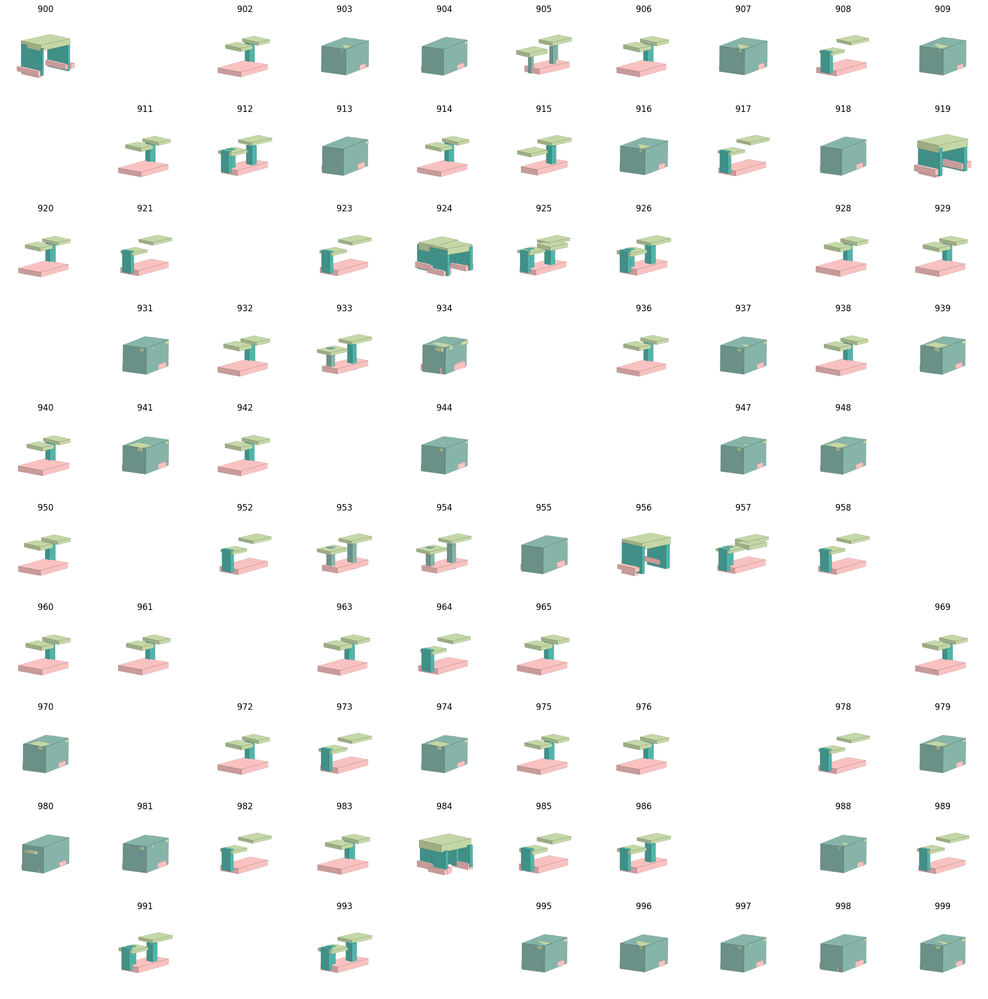

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

start_folder = 900  # Starting folder number
end_folder = 999  # Ending folder number

# Calculate number of rows and columns for the subplot grid
num_folders = end_folder - start_folder + 1
cols = 10  # You can change this to any number you prefer
rows = num_folders // cols + (num_folders % cols > 0)

# Create a figure for subplots
plt.figure(figsize=(20, 20))  # Adjust the size as needed

# Loop through each folder and add its image to a subplot
for i in range(start_folder, end_folder + 1):
    folder_name = str(i)
    folder_path = os.path.join(root_dir, folder_name)
    image_path = os.path.join(folder_path, 'recon.png')

    if os.path.exists(image_path):
        img = mpimg.imread(image_path)
        plt.subplot(rows, cols, i - start_folder + 1)
        plt.imshow(img)
        plt.title(folder_name)
        plt.axis('off')
    else:
        print(f"Image not found: {image_path}")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
def interpolate(code1, code2, alpha):
    return code1 * (1 - alpha) + code2 * alpha

start_obj = 969
end_obj = 814
start_dir = os.path.join(root_dir, str(start_obj))
end_dir = os.path.join(root_dir, str(end_obj))
start_obj = PartNetDataset.load_object(os.path.join(start_dir, 'orig.json'))
end_obj = PartNetDataset.load_object(os.path.join(end_dir, 'orig.json'))
with torch.no_grad():
  start_code = encoder.encode_structure(start_obj.to(device))[:, :conf.feature_size]
  end_code = encoder.encode_structure(end_obj.to(device))[:, :conf.feature_size]

# interpolation
num_steps = 15
interpolated_codes = []
for step in range(num_steps + 1):
    alpha = step / num_steps
    interpolated_code = interpolate(start_code, end_code, alpha)
    interpolated_codes.append(interpolated_code)


# Decode each interpolated code
with torch.no_grad():
  interpolated_objects = [decoder.decode_structure(z = code.detach(), max_depth=conf.max_tree_depth) for code in interpolated_codes]

for obj in interpolated_objects:
  draw_partnet_objects(objects=[obj], object_names=['Reconstructed'],
                     leafs_only=True, visu_edges=True,
                     sem_colors_filename='./stats/semantics_colors/Pavilion.txt')
